In [1]:
import xarray as xr
import os
import glob
import numpy as np
import warnings
import matplotlib.pyplot as plt
import sys

sys.path.append(os.path.abspath('../src-double-gyre'))
sys.path.append(os.path.abspath('../src'))
warnings.filterwarnings("ignore")
from helpers.collection_of_experiments import CollectionOfExperiments
from plot_helpers import *
from helpers.computational_tools import gaussian_remesh, Lk_error

%load_ext autoreload
%autoreload 3

In [145]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')

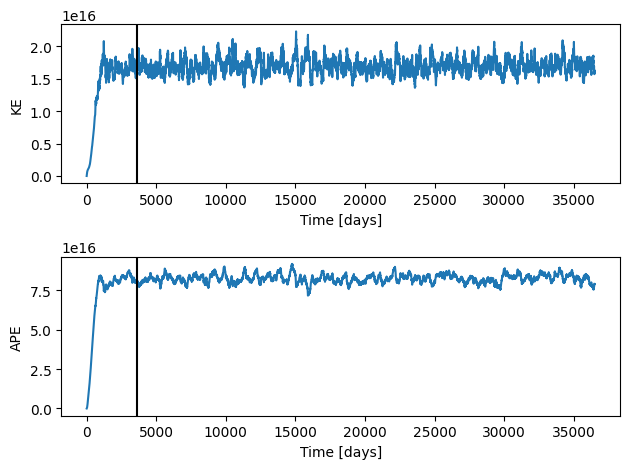

In [34]:
plt.subplot(2,1,1)
ds['R32'].series.KE.sum('Layer').plot()
plt.axvline(x=3650, color='k')

plt.subplot(2,1,2)
ds['R32'].series.APE.sum('Interface').plot()
plt.axvline(x=3650, color='k')

plt.tight_layout()

In [ ]:
ds.remesh('R32', 'R2')

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2


# Assesment of sampling errors
We want to establish, if the previous calibration experiments suffer from the data preprocessing methods. In particular, we can define the following types of errors:
1. [x] Length of the simulation (We likely expect that this source of error exists; That is why we want to increase the length of the experiment 10 times)
2. [x] Computation of the moment from the snapshots (This can be improved for the mean ssh, but cannot be improved for higher moments)
3. Spatial filtering or coarsegraining (This might be useful for higher moments)
4. Better noise model. We can assume independent snapshots, and thus derive the confidence bounds using standard methods. This noise model also clearly connects the noise to the internal variability.
5. [x] Redundant information: upper and internal layers are connected (Dhruv suggestion)
6. Ways to control the variability of kintetic energy. Simple proxy for this? Higher moments of SSH? 
7. Criteria to get rid of round eddies

# 1. Length of the simulation

In [38]:
ssh_1 = ds['R32'].ea.sel(Time=slice(365*10, 365*15)).mean('Time').isel(zi=0).compute()
ssh_2 = ds['R32'].ea.sel(Time=slice(365*15, 365*20)).mean('Time').isel(zi=0).compute()
ssh_3 = ds['R32'].ea.sel(Time=slice(365*20, 365*30)).mean('Time').isel(zi=0).compute()
ssh_4 = ds['R32'].ea.sel(Time=slice(365*30, 365*50)).mean('Time').isel(zi=0).compute()
ssh_5 = ds['R32'].ea.sel(Time=slice(365*50, 365*100)).mean('Time').isel(zi=0).compute()

In [39]:
from helpers.computational_tools import Lk_error

In [40]:
# Difference between two 5-year averaged ssh fields
print(Lk_error(ssh_1, ssh_2))
print(Lk_error(ssh_2, ssh_3))
print(Lk_error(ssh_3, ssh_4))
print(Lk_error(ssh_4, ssh_5))

[0.058913007]
[0.042722367]
[0.03232884]
[0.028923485]


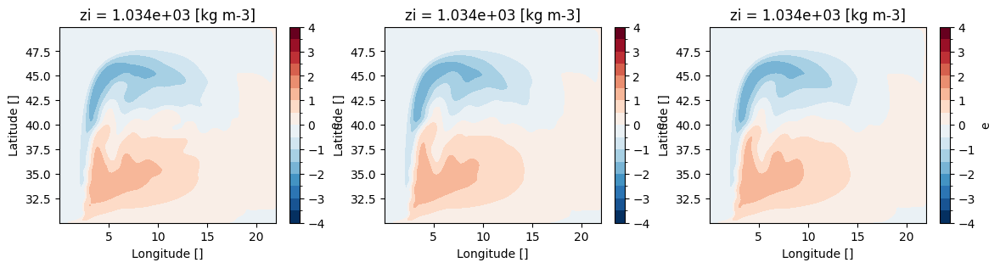

In [42]:
plt.figure(figsize=(14,3))
plt.subplot(1,3,1)
ssh_1.plot.contourf(levels = np.arange(-4,4.5,0.5))
plt.subplot(1,3,2)
ssh_3.plot.contourf(levels = np.arange(-4,4.5,0.5))
plt.subplot(1,3,3)
ssh_5.plot.contourf(levels = np.arange(-4,4.5,0.5))

# 5. Redundant information
We can clearly see the redundancy of the information in two layers. Interestingly, it is observed both in very coarse and very fine-grid simulations. We do not know yet how to interpret that strange correlation...

In [28]:
print(ds['R64'].e.yh.values)
print(ds['R64'].e.xh.values)

[30.0078125 30.0234375 30.0390625 ... 49.9609375 49.9765625 49.9921875]
[7.81250000e-03 2.34375000e-02 3.90625000e-02 ... 2.19609375e+01
 2.19765625e+01 2.19921875e+01]


In [7]:
e_R64 = ds['R64'].e.sel(xh=slice(5,15), yh=slice(35,45)).compute()
e_R2 = ds['R2'].e.sel(xh=slice(5,15), yh=slice(35,45)).compute()

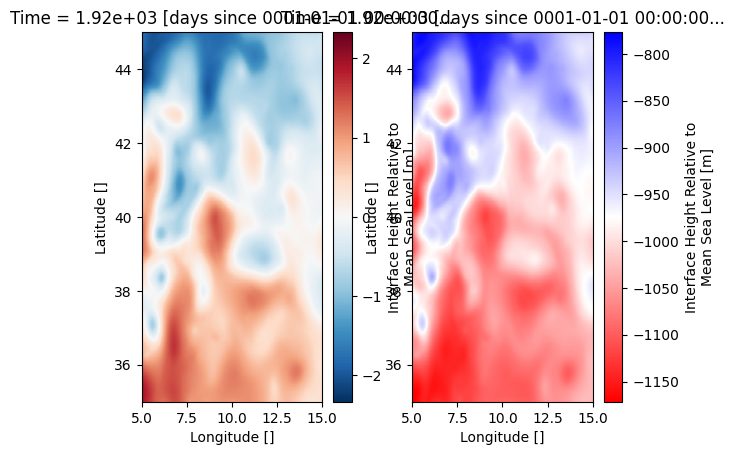

In [8]:
plt.subplot(1,2,1)
e_R64[-180][0].plot()
plt.subplot(1,2,2)
e_R64[-180][1].plot(cmap='bwr_r')

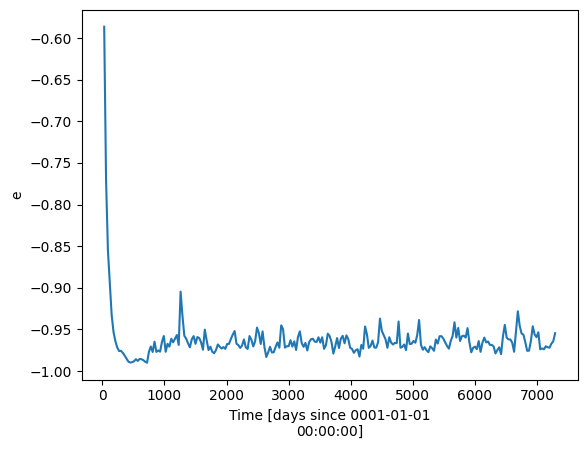

In [9]:
xr.corr(e_R64.isel(zi=0), e_R64.isel(zi=1), dim=['xh', 'yh']).plot()

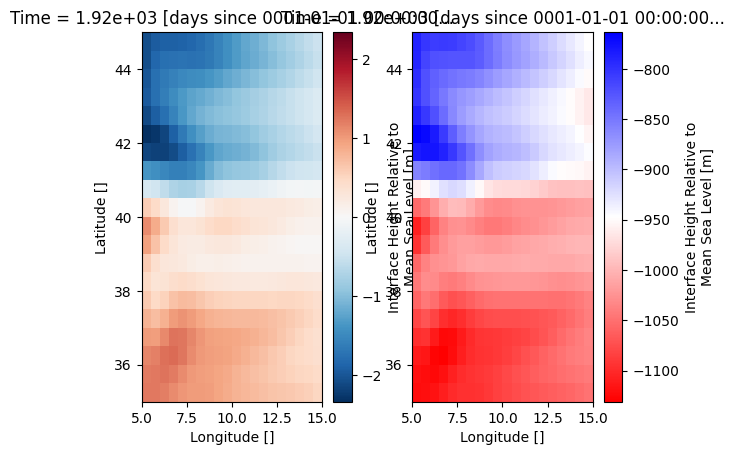

In [10]:
plt.subplot(1,2,1)
e_R2[-180][0].plot()
plt.subplot(1,2,2)
e_R2[-180][1].plot(cmap='bwr_r')

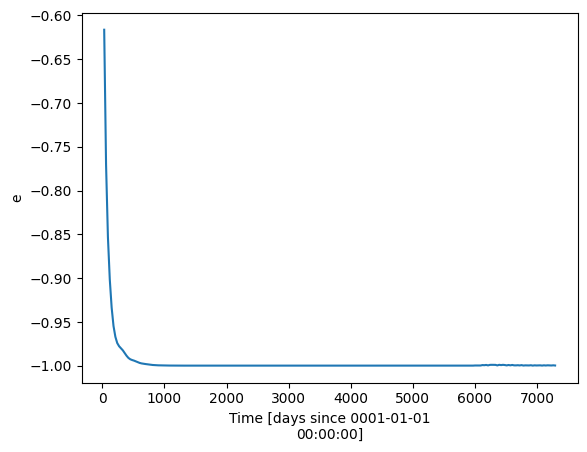

In [11]:
xr.corr(e_R2.isel(zi=0), e_R2.isel(zi=1), dim=['xh', 'yh']).plot()

In [12]:
xr.corr(e_R2.isel(zi=0), e_R2.isel(zi=1), dim=['xh', 'yh'])[-1]

<xarray.DataArray 'e' ()> Size: 4B
array(-0.9997287, dtype=float32)
Coordinates:
    Time     float64 8B 7.29e+03

Text(0.5, 1.0, 'Lower interface')

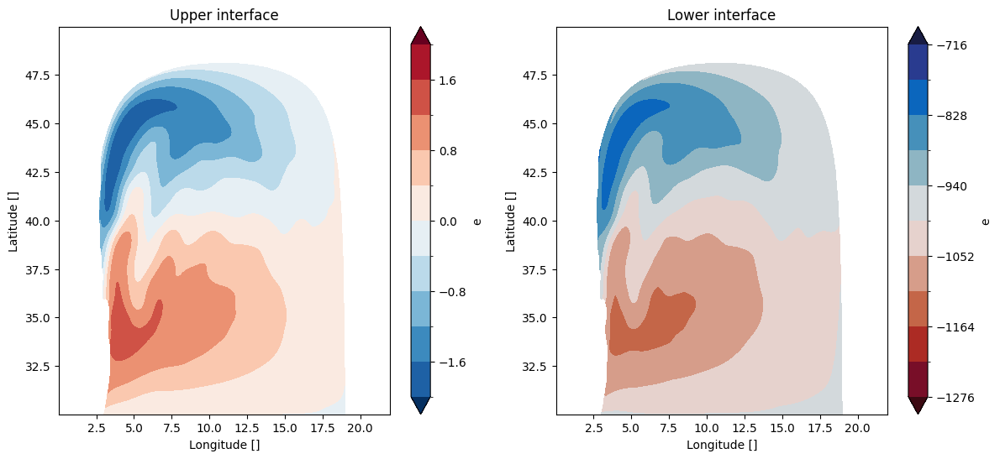

In [55]:
import cmocean

ssh = ds['R64'].ea.sel(Time=slice(365*5,365*20)).mean('Time').isel(zi=0).compute()
interace = ds['R64'].ea.sel(Time=slice(365*5,365*20)).mean('Time').isel(zi=1).compute()
mask = xr.where((ds['R64'].ea.isel(Time=-1).isel(zi=1) - ds['R64'].ea.isel(Time=-1).isel(zi=2)) > 1, 1.0, np.nan)

plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
(mask*ssh).plot.contourf(levels=np.linspace(-2,2,11), extend='both')
plt.title('Upper interface')

plt.subplot(1,2,2)
(mask*interace).plot.contourf(levels=np.linspace(-2,2,11)*140 - 996, cmap=cmocean.cm.balance_r, extend='both')
plt.title('Lower interface')

Text(0.5, 1.0, 'Lower interface')

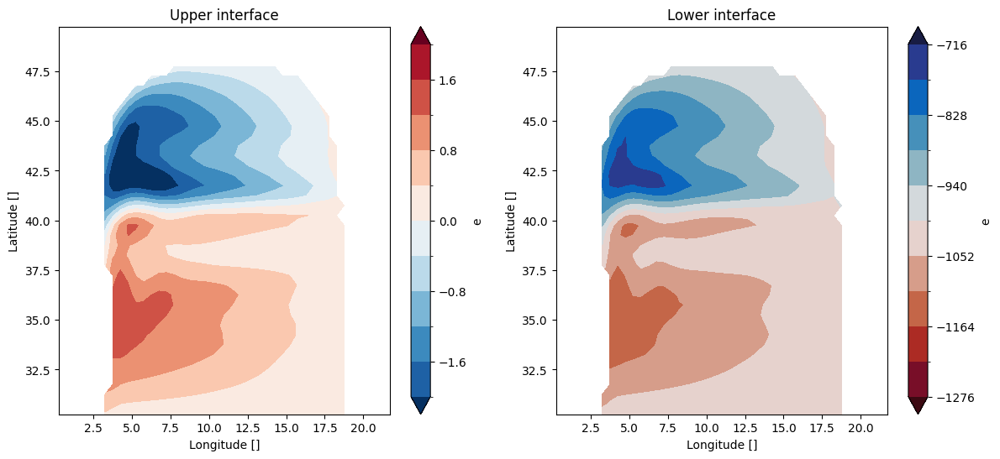

In [57]:
import cmocean

ssh = ds['R2'].ea.sel(Time=slice(365*5,365*20)).mean('Time').isel(zi=0).compute()
interace = ds['R2'].ea.sel(Time=slice(365*5,365*20)).mean('Time').isel(zi=1).compute()
mask = xr.where((ds['R2'].ea.isel(Time=-1).isel(zi=1) - ds['R2'].ea.isel(Time=-1).isel(zi=2)) > 1, 1.0, np.nan)

plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
(mask*ssh).plot.contourf(levels=np.linspace(-2,2,11), extend='both')
plt.title('Upper interface')

plt.subplot(1,2,2)
(mask*interace).plot.contourf(levels=np.linspace(-2,2,11)*140 - 996, cmap=cmocean.cm.balance_r, extend='both')
plt.title('Lower interface')

# Moment from the snapshot
The error introduced by time averaging from a snapshot as opposed to the time-mean is one order of magnitude smaller compared to the error introduced by finite length simulation. As the number of samples will be increased with the length of the simulation, the error is expected to be even smaller than 0.005. Our most succesful simulations likely will have RMSE of 0.05, and so the error will be at least 10 times less.

In [43]:
assh_1 = ds['R32'].ea.sel(Time=slice(365*10, 365*100)).mean('Time').isel(zi=0).compute()

ssh_1 = ds['R32'].e.sel(Time=slice(365*10, 365*100)).mean('Time').isel(zi=0).compute()

In [45]:
print(Lk_error(assh_1, ssh_1))

[0.0020276664]


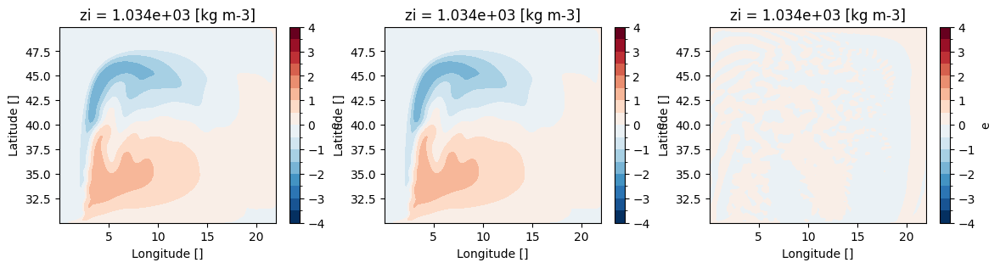

In [46]:
plt.figure(figsize=(14,3))
plt.subplot(1,3,1)
ssh_1.plot.contourf(levels = np.arange(-4,4.5,0.5))
plt.subplot(1,3,2)
assh_1.plot.contourf(levels = np.arange(-4,4.5,0.5))
plt.subplot(1,3,3)
(ssh_1-assh_1).plot.contourf(levels = np.arange(-4,4.5,0.5))

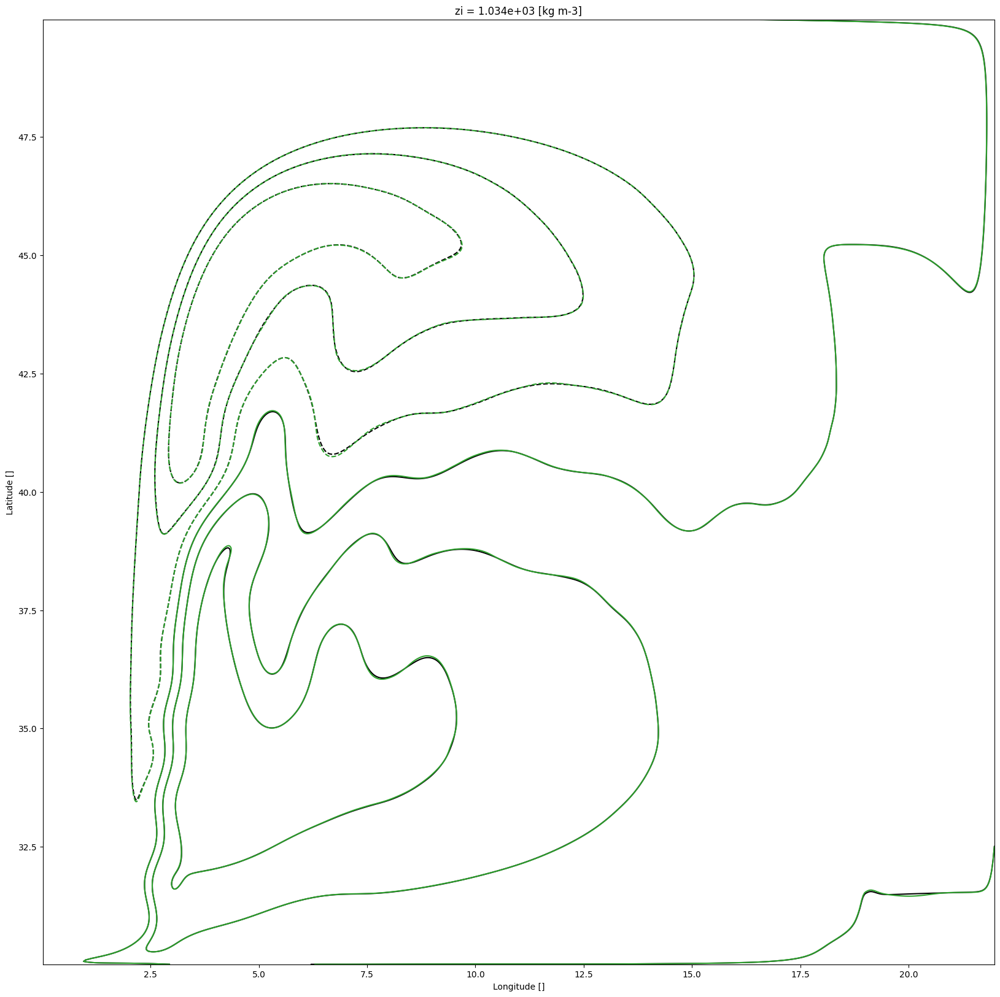

In [49]:
plt.figure(figsize=(20,20))
assh_1.plot.contour(levels = np.arange(-4,4.5,0.5), colors='k', lss='-')
ssh_1.plot.contour(levels = np.arange(-4,4.5,0.5), colors='tab:green', lss='--')

In [50]:
ssh_series = ds['R32'].e.sel(xh=10, yh=40, method='nearest').isel(zi=0).compute()
assh_series = ds['R32'].ea.sel(xh=10, yh=40, method='nearest').isel(zi=0).compute()

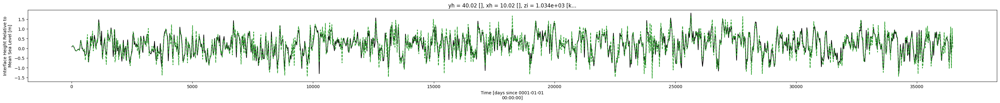

In [51]:
plt.figure(figsize=(40,3))
assh_series.plot(color='k')
ssh_series.plot(color='tab:green', ls='--')

# 6. Ways to control variability of kinetic energy. Proxy for this? 

Two thoughts:
* May be, we do not need to control that if consider multiple resolutions
* Why should we consider proxy if we can consider variability of KE itself

# Preparing dataset for calibration
We used the simplest possible target data and noise model. 

In [3]:
ds['R32']

In [4]:
# Last 90 years of simulation coarsegrained to 1/2 degree
e = ds['R32'].e.sel(Time=slice(365*10,None)).isel(zi=0).coarsen({'xh':16, 'yh':16}).mean().compute()

In [7]:
dataset = xr.Dataset()
dataset['e_mean'] = e.mean('Time')
dataset['e_std'] = e.std('Time')

# Noise model for sample mean: https://online.stat.psu.edu/stat414/lesson/24/24.4
# Noise model for sample variance https://davegiles.blogspot.com/2013/05/whats-variance-of-sample-variance.html,
# Also see Delta method to convert to sample std
n = len(e.Time)
dataset['e_mean_var'] = dataset['e_std']**2 / n
dataset['e_std_var'] = 0.5 * dataset['e_mean_var']

dataset['e_mean_var_ave'] = dataset['e_mean_var'].mean() + dataset['e_mean_var'] * 0
dataset['e_std_var_ave'] = dataset['e_std_var'].mean() + dataset['e_std_var'] * 0

In [8]:
dataset.astype('float32').to_netcdf('../scripts/R32/R2_ssh.nc')

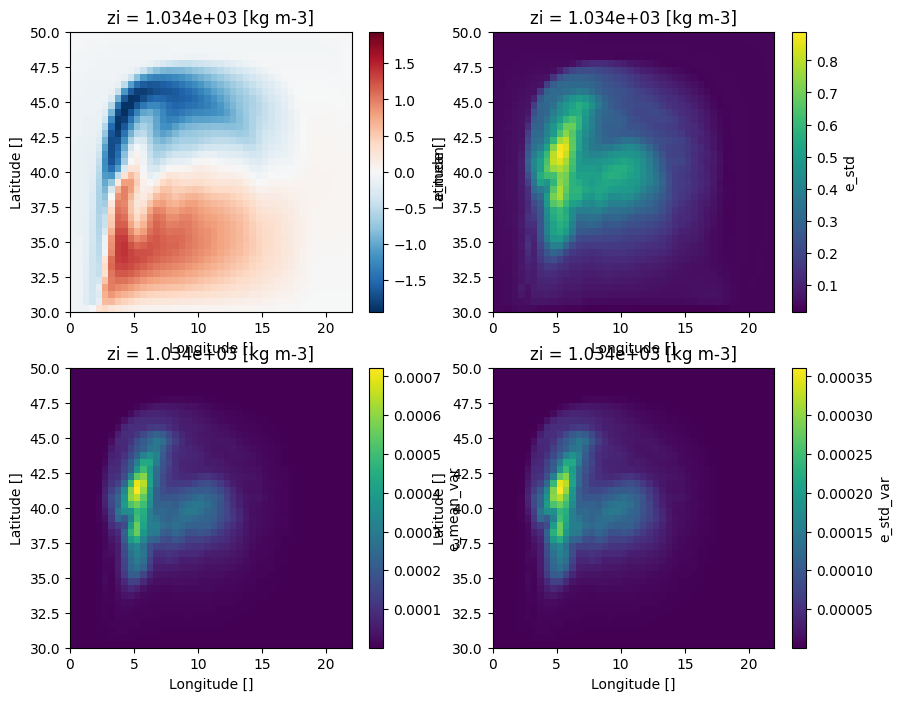

In [9]:
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
dataset['e_mean'].plot()
plt.subplot(2,2,2)
dataset['e_std'].plot()
plt.subplot(2,2,3)
dataset['e_mean_var'].plot()
plt.subplot(2,2,4)
dataset['e_std_var'].plot()

# Plot intermediate simulations results

In [2]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')

In [25]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2_R4_R8', additional_subfolder='output', prefix='R2-R4-R8')

In [26]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2_R4_R8', prefix='incomplete-R2-R4-R8')

In [27]:
for exp in ds.exps:
    if 'incomplete' in exp:
        print(exp)

incomplete-R2-R4-R8-iteration-01-R8-ens-member-11
incomplete-R2-R4-R8-iteration-01-R8-ens-member-15
incomplete-R2-R4-R8-iteration-01-R8-ens-member-21
incomplete-R2-R4-R8-iteration-01-R8-ens-member-23
incomplete-R2-R4-R8-iteration-01-R8-ens-member-06
incomplete-R2-R4-R8-iteration-01-R8-ens-member-13
incomplete-R2-R4-R8-iteration-01-R8-ens-member-18
incomplete-R2-R4-R8-iteration-01-R8-ens-member-29
incomplete-R2-R4-R8-iteration-01-R8-ens-member-00
incomplete-R2-R4-R8-iteration-01-R8-ens-member-22
incomplete-R2-R4-R8-iteration-01-R8-ens-member-05
incomplete-R2-R4-R8-iteration-01-R8-ens-member-14
incomplete-R2-R4-R8-iteration-01-R8-ens-member-16
incomplete-R2-R4-R8-iteration-01-R8-ens-member-02
incomplete-R2-R4-R8-iteration-01-R8-ens-member-01
incomplete-R2-R4-R8-iteration-01-R8-ens-member-12
incomplete-R2-R4-R8-iteration-01-R8-ens-member-20
incomplete-R2-R4-R8-iteration-01-R8-ens-member-09
incomplete-R2-R4-R8-iteration-01-R8-ens-member-28
incomplete-R2-R4-R8-iteration-01-R8-ens-member-07


In [91]:
def plot_ensemble(RR='R2', iteration='00', metric='KE', legend=False):
    if metric == 'KE':
        fun = lambda x: x.series.KE.sum('Layer')
    if metric == 'APE':
        fun = lambda x: x.series.APE.sum('Interface')

    for ens in range(30):
        try:
            fun(ds[f'R2-R4-R8-iteration-{iteration}-{RR}-ens-member-{ens}']).plot(alpha=0.3, color='tab:blue')
        except:
            pass
    fun(ds['R32']).plot(color='k', label='$1/32^{\\circ}$')
    plt.plot(np.nan, np.nan,ls='-', color='tab:blue', alpha=0.3, label='Ensemble members')
    if legend:
        plt.legend()

    if metric == 'KE':
        plt.ylim([0,3e+16])

    if metric == 'APE':
        plt.ylim([0,1.5e+17])

    plt.xticks(np.arange(1,10)*10*365, np.arange(1,10)*10)
    plt.xlabel('Years')

    plt.grid()

In [ ]:
plt.figure(figsize=(15,8))

plt.subplot(2,3,1)
plot_ensemble('R2', '00', 'KE', legend=True)
plt.ylabel('Kinetic Energy [J]')
plt.title('$1/2^{\\circ}$')

plt.subplot(2,3,4)
plot_ensemble('R2', '00', 'APE')
plt.ylabel('Available Potential Energy [J]')

plt.subplot(2,3,2)
plot_ensemble('R4', '00', 'KE')
plt.ylabel('')
plt.title('$1/4^{\\circ}$')

plt.subplot(2,3,5)
plot_ensemble('R4', '00', 'APE')
plt.ylabel('')

plt.subplot(2,3,3)
plot_ensemble('R8', '00', 'KE')
plt.ylabel('')
plt.title('$1/8^{\\circ}$')

plt.subplot(2,3,6)
plot_ensemble('R8', '00', 'APE')
plt.ylabel('')

plt.suptitle('Initial ensemble of 30 members for EKI')

plt.savefig('ensemble_initial_EKI_R2_R4_R8.png', dpi=200)

item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found
item not found


# Calibration results

## Metrics reader

In [27]:
import xarray as xr
 
path_hires = '../scripts/R64_R2/full.nc'
hires = xr.open_dataset(path_hires)

# This number represents how many elements in the observational vector
# In our case, it is 2 metrics x 2 layers x 10 lats x 11 lons = 440
obs_length = 440

'''
Here, gamma_mean and gamma_std are variances for the two fields
using in EKI during training
'''
gamma_mean = 2 * hires['e_mean_var_ave']
gamma_std  = 2 * hires['e_std_var_ave']
e_mean_true = hires['e_mean']
e_std_true = hires['e_std']


def MSE_weighted(e_mean, e_std):
    out =  ((e_mean - e_mean_true)**2 / gamma_mean + \
            (e_std  - e_std_true )**2 / gamma_std).sum(['xh', 'yh', 'zi']) / obs_length
    return xr.where(out > 0, out, np.nan)

def read_metrics(path_metrics = '/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/variability-R2-eANN/data-misfit/metrics.nc'):

    metrics = xr.open_dataset(path_metrics)
    
    WMSE = MSE_weighted(metrics['e_mean'], metrics['e_std']).squeeze()
    
    # EKI converges to a point of maximum posterior. Best estimation of forward map in that point is given as an ensemble mean
    WMSE_MAP = MSE_weighted(metrics['e_mean'].mean('ens'), metrics['e_std'].mean('ens')).squeeze()

    return dict(WMSE = WMSE, WMSE_MAP = WMSE_MAP, metrics_file = metrics)

In [142]:
def plot_errorbar(array, color='k', label='EKI', ens='ens', style='bar'):
    ymin = array.min(ens)
    ymax = array.max(ens)
    ymid = array.mean(ens)

    yerr = np.vstack([ymid - ymin, ymax - ymid])
    
    x = np.arange(len(ymin))
    if style == 'bar':
        plt.errorbar(x, ymid, yerr=yerr, fmt='o', capsize=4, color=color, label=label, ls='-')
    elif style == 'shade':
        # line + shaded region
        plt.plot(x, ymid, color=color, label=label)
        plt.fill_between(
            x, ymin, ymax,
            color=color, alpha=0.3
        )
    else:
        raise ValueError(f"Unknown style '{style}'. Use 'bar' or 'shade'.")


In [143]:
metrics_10years = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/variability-R2-eANN/data-misfit/metrics.nc')
metrics         = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-v2/metrics.nc')

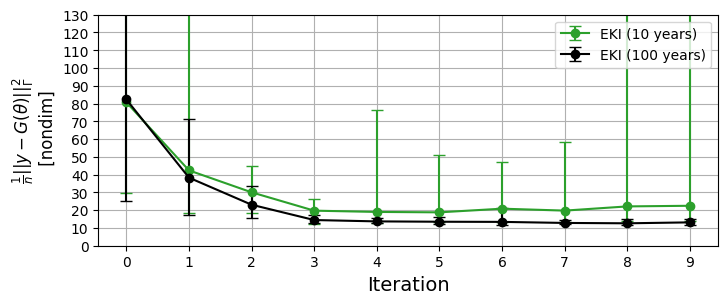

In [144]:
plt.figure(figsize=(8,3))

plot_errorbar(metrics_10years['WMSE'], label='EKI (10 years)', color='tab:green', style='bar')
plot_errorbar(metrics['WMSE'], label='EKI (100 years)')

plt.ylabel('$\\frac{1}{n}||y-G(\\theta)||_{\Gamma}^2$\n [nondim]', fontsize=12)

plt.xticks(np.arange(10));
plt.ylim([0,130])
plt.yticks(np.arange(0,140,10))
plt.xlabel('Iteration', fontsize=14)
plt.grid()
plt.legend(loc='upper right')

plt.savefig('EKI-DMC-R2-100-years.pdf', bbox_inches='tight')

In [89]:
param = metrics['metrics_file'].param
param_10years = metrics_10years['metrics_file'].param
# mask = xr.where(np.isnan(metrics['WMSE']), np.nan, 1.)
# mask_10years = xr.where(np.isnan(metrics_10years['WMSE']), np.nan, 1.)

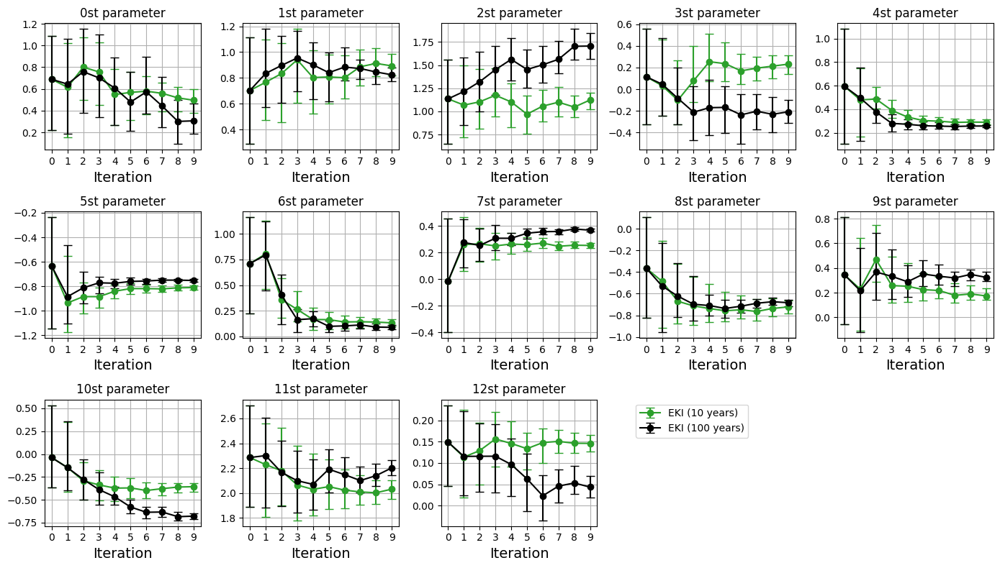

In [124]:
plt.figure(figsize=(14,8))
for pdim in range(13):
    plt.subplot(3,5,1 + pdim)
    plot_errorbar(param_10years.isel(pdim=pdim), label='EKI (10 years)', color='tab:green', style='bar')
    plot_errorbar(param.isel(pdim=pdim), label='EKI (100 years)', style='bar')

    plt.xticks(np.arange(10));
    #plt.ylim([-3,3])
    plt.xlabel('Iteration', fontsize=14)
    plt.grid()
    plt.title(f'{pdim}st parameter')

plt.tight_layout()
plt.legend(loc='upper right', bbox_to_anchor=(2,1))
plt.savefig('parameters-100-years.pdf')

# Comparison of different methods

In [145]:
metrics_ens100 = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-v2/metrics.nc')
metrics_eki_dmc = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-v2-ens-30/metrics.nc')
metrics_uki_dmc = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-UKI/metrics.nc')
metrics_utki_dmc = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-UTKI/metrics.nc')
metrics_uki_no_dmc = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-UKI-no-DMC/metrics.nc')
metrics_etki_dmc = read_metrics('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-ETKI/metrics.nc')

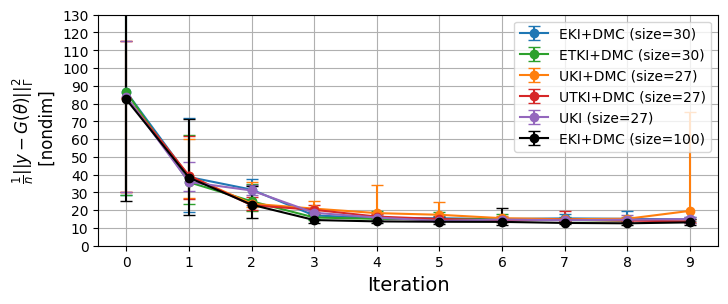

In [147]:
plt.figure(figsize=(8,3))

plot_errorbar(metrics_eki_dmc['WMSE'], label='EKI+DMC (size=30)', color='tab:blue')
plot_errorbar(metrics_etki_dmc['WMSE'], label='ETKI+DMC (size=30)', color='tab:green')
plot_errorbar(metrics_uki_dmc['WMSE'], label='UKI+DMC (size=27)', color='tab:orange')
plot_errorbar(metrics_utki_dmc['WMSE'], label='UTKI+DMC (size=27)', color='tab:red')
plot_errorbar(metrics_uki_no_dmc['WMSE'], label='UKI (size=27)', color='tab:purple')

plot_errorbar(metrics_ens100['WMSE'], label='EKI+DMC (size=100)')

plt.ylabel('$\\frac{1}{n}||y-G(\\theta)||_{\Gamma}^2$\n [nondim]', fontsize=12)

plt.xticks(np.arange(10));
plt.ylim([0,130])
plt.yticks(np.arange(0,140,10))
plt.xlabel('Iteration', fontsize=14)
plt.grid()
plt.legend(loc='upper right')

plt.savefig('EKI-comparison-R2-100-years.pdf', bbox_inches='tight')

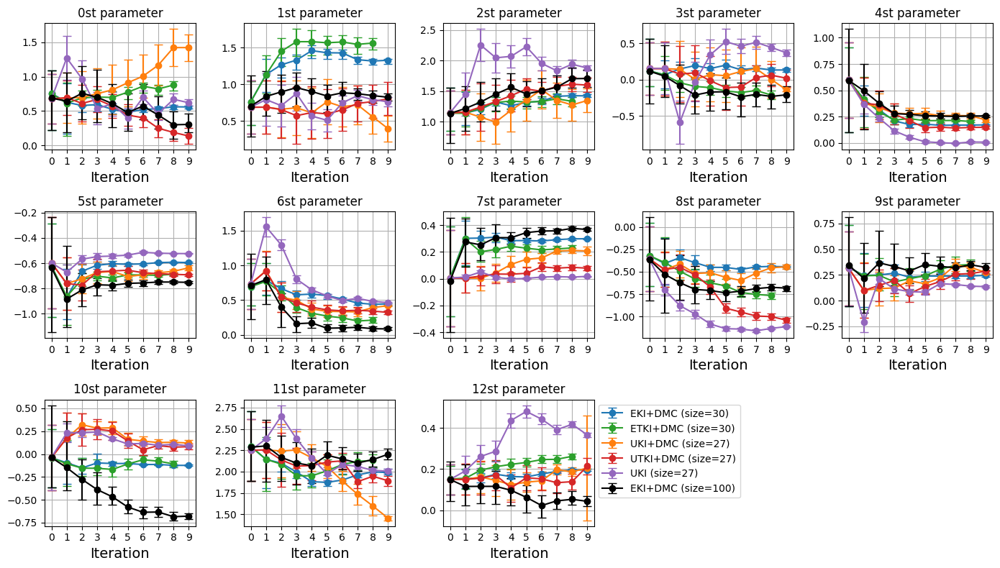

In [162]:
plt.figure(figsize=(14,8))
for pdim in range(13):
    plt.subplot(3,5,1 + pdim)
    
    plot_errorbar(metrics_eki_dmc['metrics_file'].param.isel(pdim=pdim), label='EKI+DMC (size=30)', color='tab:blue')
    plot_errorbar(metrics_etki_dmc['metrics_file'].param.isel(pdim=pdim), label='ETKI+DMC (size=30)', color='tab:green')
    plot_errorbar(metrics_uki_dmc['metrics_file'].param.isel(pdim=pdim), label='UKI+DMC (size=27)', color='tab:orange')
    plot_errorbar(metrics_utki_dmc['metrics_file'].param.isel(pdim=pdim), label='UTKI+DMC (size=27)', color='tab:red')
    plot_errorbar(metrics_uki_no_dmc['metrics_file'].param.isel(pdim=pdim), label='UKI (size=27)', color='tab:purple')

    plot_errorbar(metrics_ens100['metrics_file'].param.isel(pdim=pdim), label='EKI+DMC (size=100)')

    plt.xticks(np.arange(10));
    #plt.ylim([-3,3])
    plt.xlabel('Iteration', fontsize=14)
    plt.grid()
    plt.title(f'{pdim}st parameter')

plt.tight_layout()
plt.legend(loc='upper right', bbox_to_anchor=(2,1))
plt.savefig('parameters-comparison-100-years.pdf')

In [2]:
def plot_ensemble(exp='hundred-years/R2-old-algorithm-v2', iteration='00', metric='KE', legend=False, ens_size=30):
    if metric == 'KE':
        fun = lambda x: x.KE.sum('Layer')
    if metric == 'APE':
        fun = lambda x: x.APE.sum('Interface')

    for ens in range(ens_size):
        try:
            ds = xr.open_dataset(f'/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/{exp}/iteration-{iteration}/R2/ens-member-{ens}/output/ocean.stats.nc', decode_times=False)
            fun(ds).plot(alpha=0.3, color='tab:blue')
        except:
            pass
    hires = xr.open_dataset(f'/scratch/pp2681/mom6/Feb2022/bare/R32/output/ocean.stats.nc', decode_times=False)
    if metric == 'KE':
        (0.715*hires.KE.sum('Layer')).plot(color='k', label='$1/32^{\\circ}$ coarsegrained to $1/2^{\\circ}$')
    elif metric == 'APE':
        (0.9915*hires.APE.sum('Interface')).plot(color='k', label='$1/32^{\\circ}$ coarsegrained to $1/2^{\\circ}$')
        
    plt.plot(np.nan, np.nan,ls='-', color='tab:blue', alpha=0.3, label='$1/2^{\\circ}$ Ensemble members')
    if legend:
        plt.legend()

    if metric == 'KE':
        plt.ylim([0,3e+16])

    if metric == 'APE':
        plt.ylim([0,1.5e+17])

    plt.xticks(np.arange(0,11)*10*365, np.arange(0,11)*10)
    plt.xlabel('Years')

    plt.grid()

In [3]:
def plot(iteration=0, exp='hundred-years/R2-old-algorithm-series'):
    plt.figure(figsize=(12,8))
    plt.subplot(2,1,1)
    plot_ensemble(exp, iteration=f'0{iteration}', metric='KE', ens_size=100, legend=True)

    plt.subplot(2,1,2)
    plot_ensemble(exp, iteration=f'0{iteration}', metric='APE', ens_size=100, legend=True)

    plt.suptitle(f'Iteration {iteration}')

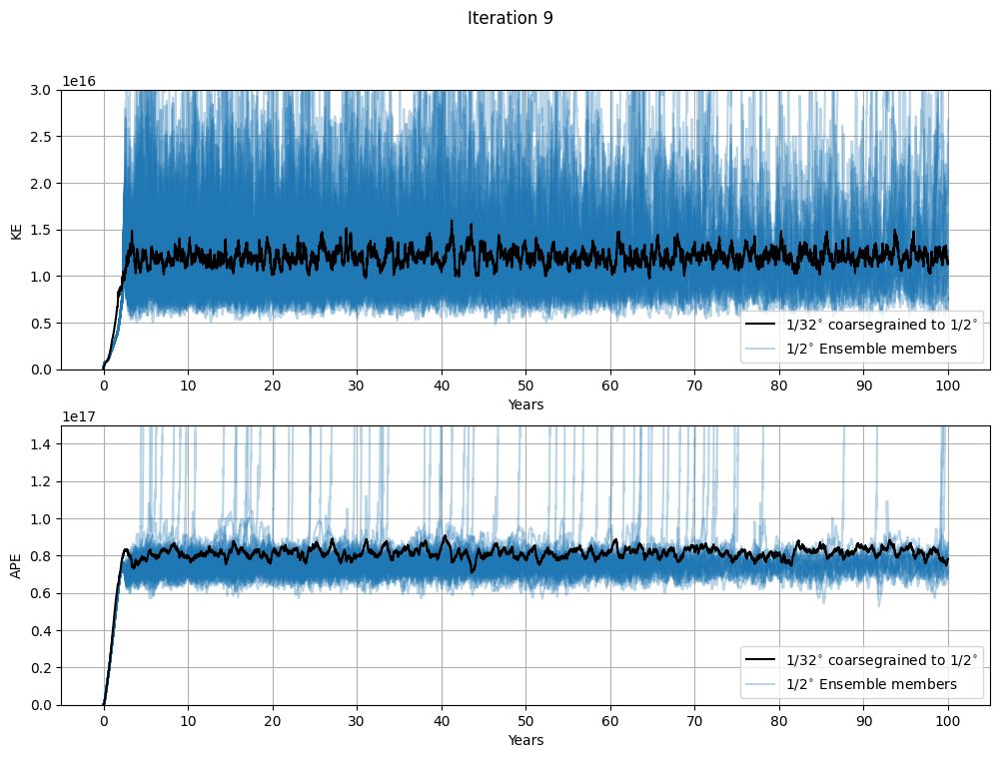

In [4]:
plot(exp='hundred-years/R2-old-algorithm-v2', iteration=9)
plt.savefig('KE-APE-v2.png', dpi=200)

In [5]:
create_animation_ffmpeg(plot, range(10), filename='KE-APE-series.mp4', FPS=1)

Frames already exists in folder .ffmpeg/KE-APE-series
Savefig .ffmpeg/KE-APE-series/frame-0.png
Savefig .ffmpeg/KE-APE-series/frame-1.png96753
Savefig .ffmpeg/KE-APE-series/frame-2.png39325
Savefig .ffmpeg/KE-APE-series/frame-3.png08334
Savefig .ffmpeg/KE-APE-series/frame-4.png26883
Savefig .ffmpeg/KE-APE-series/frame-5.png98928
Savefig .ffmpeg/KE-APE-series/frame-6.png33084
Savefig .ffmpeg/KE-APE-series/frame-7.png037
Savefig .ffmpeg/KE-APE-series/frame-8.png2332
Savefig .ffmpeg/KE-APE-series/frame-9.png8631
Native resolution of snapshots is used: 2002x1518

Animation KE-APE-series.mp4 at FPS=1 will last for 10.0 seconds. The frames are saved to 
.ffmpeg/KE-APE-series

Running the command:
cd /home/pp2681/calibration/notebooks; ffmpeg -y -framerate 1 -i .ffmpeg/KE-APE-series/frame-%d.png -s:v 2002x1518 -c:v libx264 -profile:v high -crf 20 -pix_fmt yuv420p KE-APE-series.mp4


ffmpeg version 4.2.4-1ubuntu0.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.3.0-10ubuntu2)
  configuration: --prefix=/usr --extra-version=1ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-l

In [1]:
# Individual ensemble members

In [22]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration', additional_subfolder='output')

In [49]:
ds.remesh('R64', 'R2')

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2


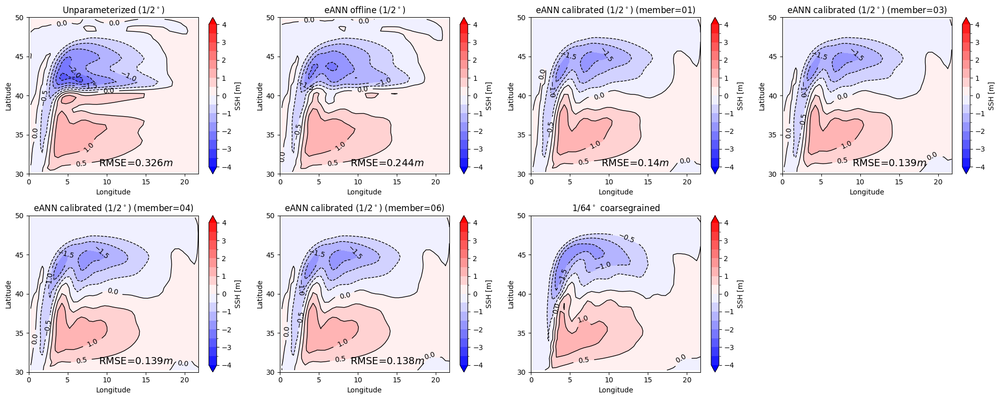

In [18]:
ds.plot_ssh(['R2', 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-01',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-03',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
            'R64_R2'],
           labels=['Unparameterized ($1/2^\circ$)', 'eANN offline ($1/2^\circ$)', 
           'eANN calibrated ($1/2^\circ$) (member=01)',
           'eANN calibrated ($1/2^\circ$) (member=03)',
           'eANN calibrated ($1/2^\circ$) (member=04)',
           'eANN calibrated ($1/2^\circ$) (member=06)',
           '$1/64^\circ$ coarsegrained'], ncols=4)

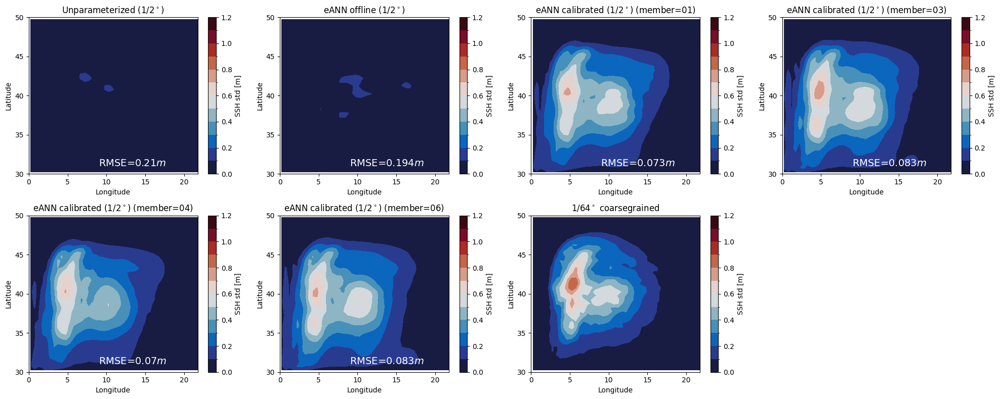

In [19]:
ds.plot_ssh_std(['R2', 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-01',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-03',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
            'R64_R2'],
           labels=['Unparameterized ($1/2^\circ$)', 'eANN offline ($1/2^\circ$)', 
           'eANN calibrated ($1/2^\circ$) (member=01)',
           'eANN calibrated ($1/2^\circ$) (member=03)',
           'eANN calibrated ($1/2^\circ$) (member=04)',
           'eANN calibrated ($1/2^\circ$) (member=06)',
           '$1/64^\circ$ coarsegrained'], ncols=4, target='R64_R2')

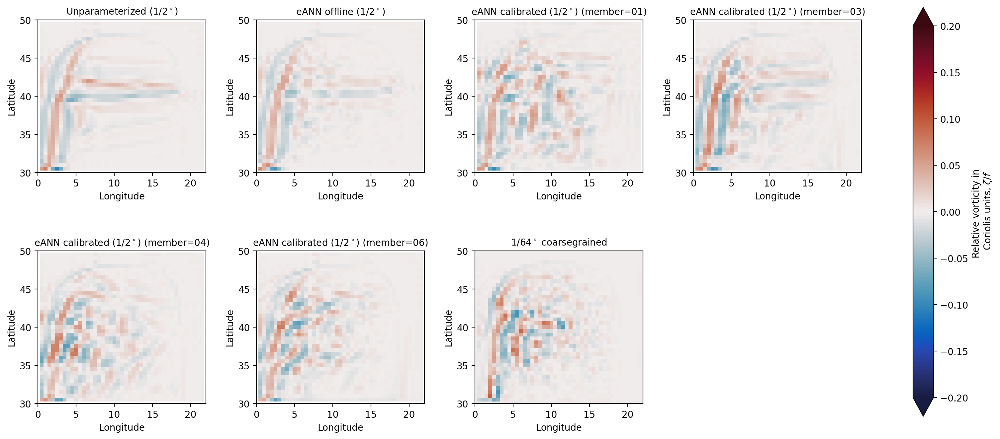

In [27]:
ds.plot_RV(['R2', 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-01',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-03',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
            'R64_R2'],
           labels=['Unparameterized ($1/2^\circ$)', 'eANN offline ($1/2^\circ$)', 
           'eANN calibrated ($1/2^\circ$) (member=01)',
           'eANN calibrated ($1/2^\circ$) (member=03)',
           'eANN calibrated ($1/2^\circ$) (member=04)',
           'eANN calibrated ($1/2^\circ$) (member=06)',
           '$1/64^\circ$ coarsegrained'], ncols=4)

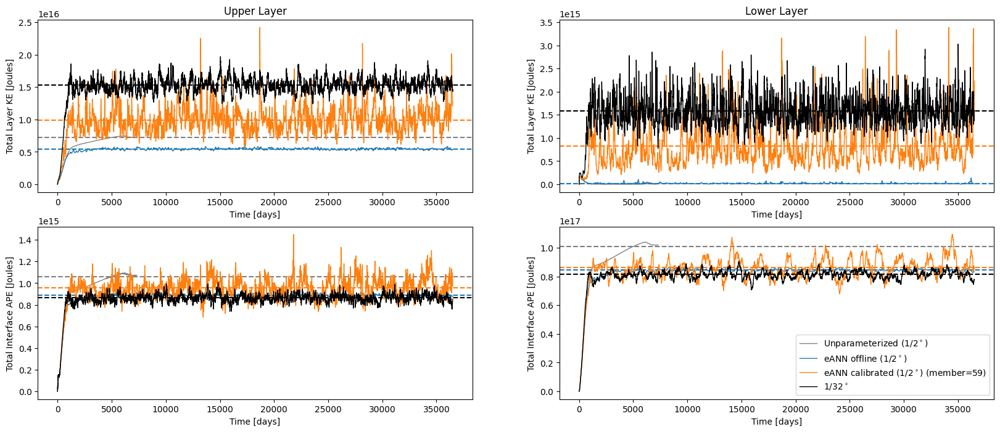

In [48]:
ds.plot_series([
                 'R2', 
                 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
                 'hundred-years-R2-old-algorithm-series-iteration-05-R2-ens-member-75',
                 #'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-03',
                 #'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
                 #'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
                  'R32'],
                  labels=[
                        'Unparameterized ($1/2^\circ$)', 
                        'eANN offline ($1/2^\circ$)', 
                        'eANN calibrated ($1/2^\circ$) (member=59)',
                        #'eANN calibrated ($1/2^\circ$) (member=03)',
                        #'eANN calibrated ($1/2^\circ$) (member=04)',
                        #'eANN calibrated ($1/2^\circ$) (member=06)',
                        '$1/32^\circ$'])

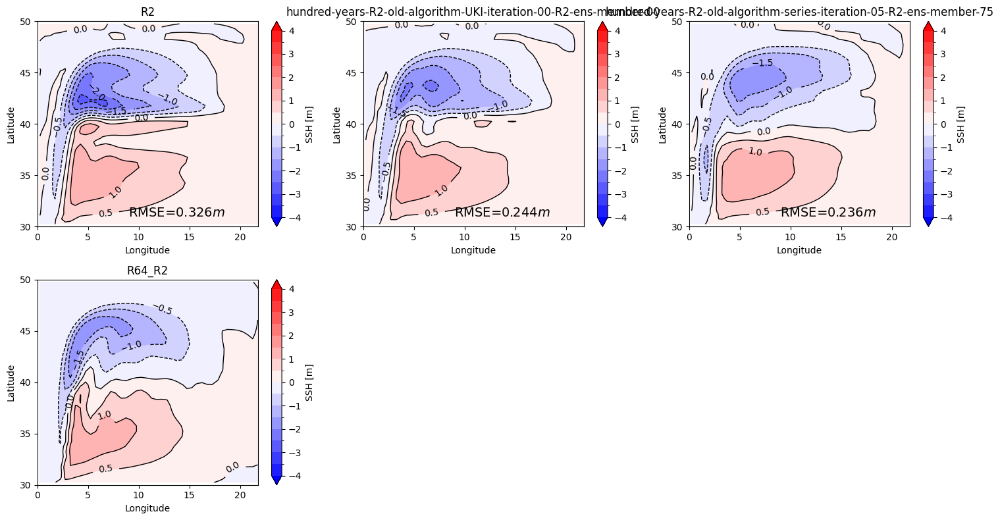

In [52]:
ds.plot_ssh(['R2', 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
'hundred-years-R2-old-algorithm-series-iteration-05-R2-ens-member-75', 'R64_R2'])

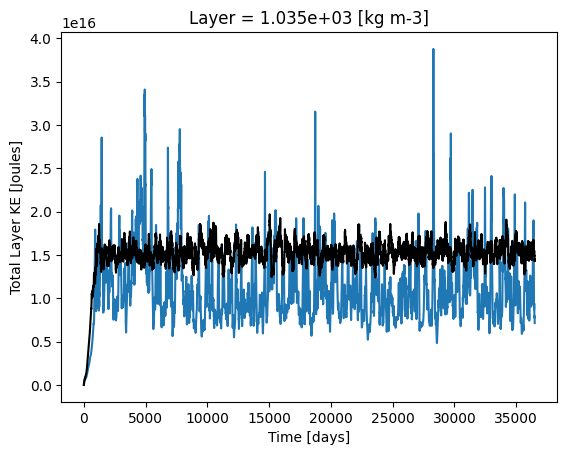

In [24]:
ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06'].series.KE.isel(Layer=0).plot()
ds['R32'].series.KE.isel(Layer=0).plot(color='k')

In [25]:
ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06'].series.KE.isel(Layer=0).sel(Time=slice(3650,None)).std().compute()

<xarray.DataArray 'KE' ()> Size: 8B
array(3.87634967e+15)
Coordinates:
    Layer    float64 8B 1.035e+03

In [26]:
ds['R32'].series.KE.isel(Layer=0).sel(Time=slice(3650,None)).std().compute()

<xarray.DataArray 'KE' ()> Size: 8B
array(1.04926225e+15)
Coordinates:
    Layer    float64 8B 1.035e+03

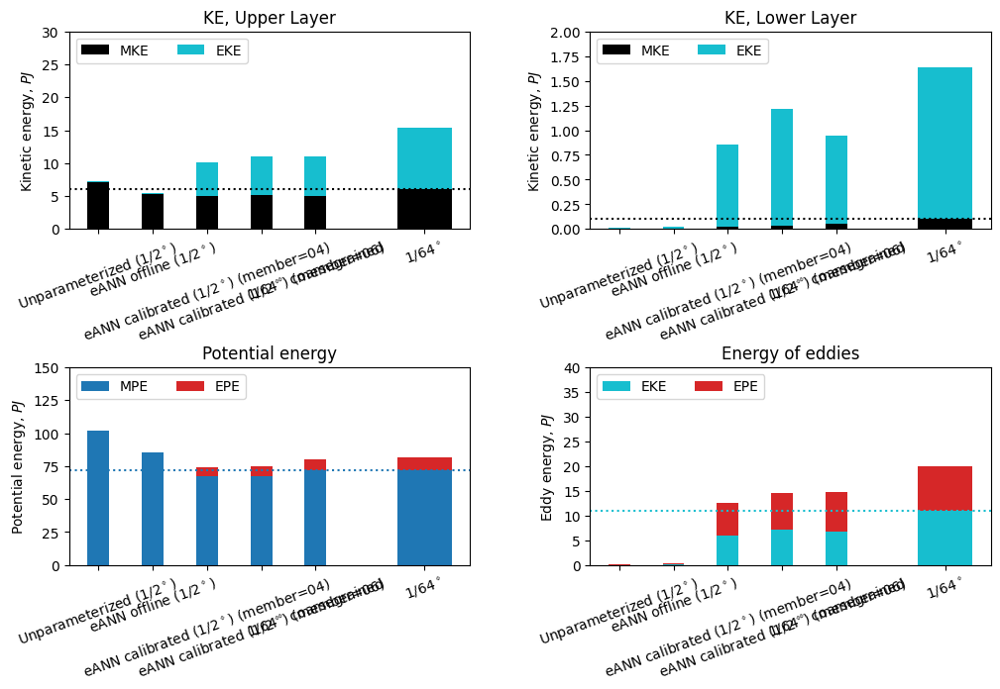

In [ ]:
# Excessive variability in KE/APE time series are not seen as excessive eddy energy. Thus, it is not unlagged second moment which is responsible for this

ds.plot_KE_PE([
                 'R2', 
                 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00', 
                 'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
                 'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
                  'R64_R2', 'R64'],
                  labels=[
                        'Unparameterized ($1/2^\circ$)', 
                        'eANN offline ($1/2^\circ$)', 
                        'eANN calibrated ($1/2^\circ$) (member=04)',
                        'eANN calibrated ($1/2^\circ$) (member=06)',
                        '$1/64^\circ$ coarsegrained', '$1/64^\circ$'])

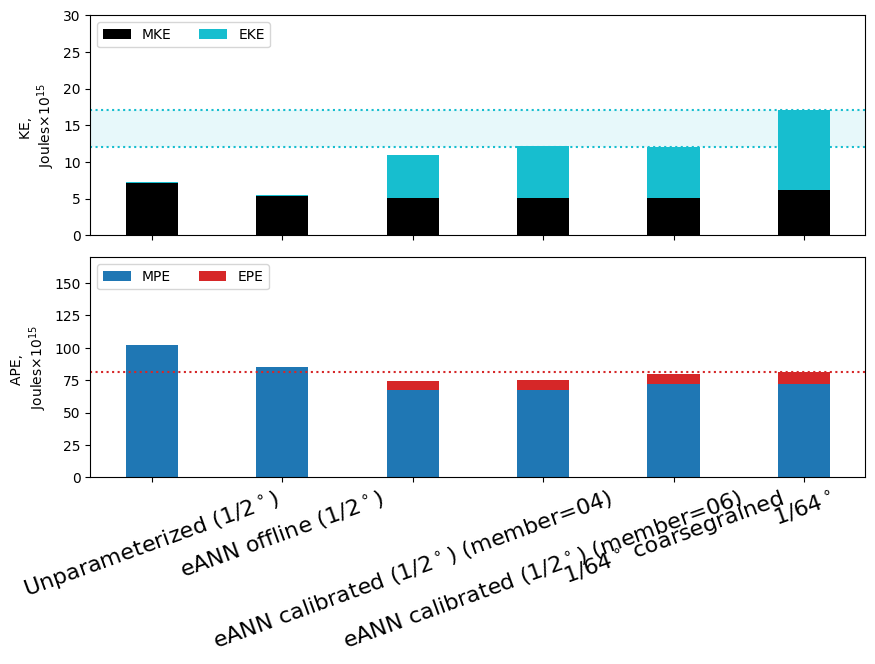

In [ ]:
# Second moments are almost perfect. So we need to look into different statistics

ds.plot_KE_PE_simpler([
                 'R2', 
                 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
                 'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
                 'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
                  'R64_R2', 'R64'],
                  labels=[
                        'Unparameterized ($1/2^\circ$)', 
                        'eANN offline ($1/2^\circ$)', 
                        'eANN calibrated ($1/2^\circ$) (member=04)',
                        'eANN calibrated ($1/2^\circ$) (member=06)',
                        '$1/64^\circ$ coarsegrained', '$1/64^\circ$'])

In [137]:
e = ds['R32'].e.isel(zi=0).coarsen({'xh':16, 'yh':16}).mean().compute()

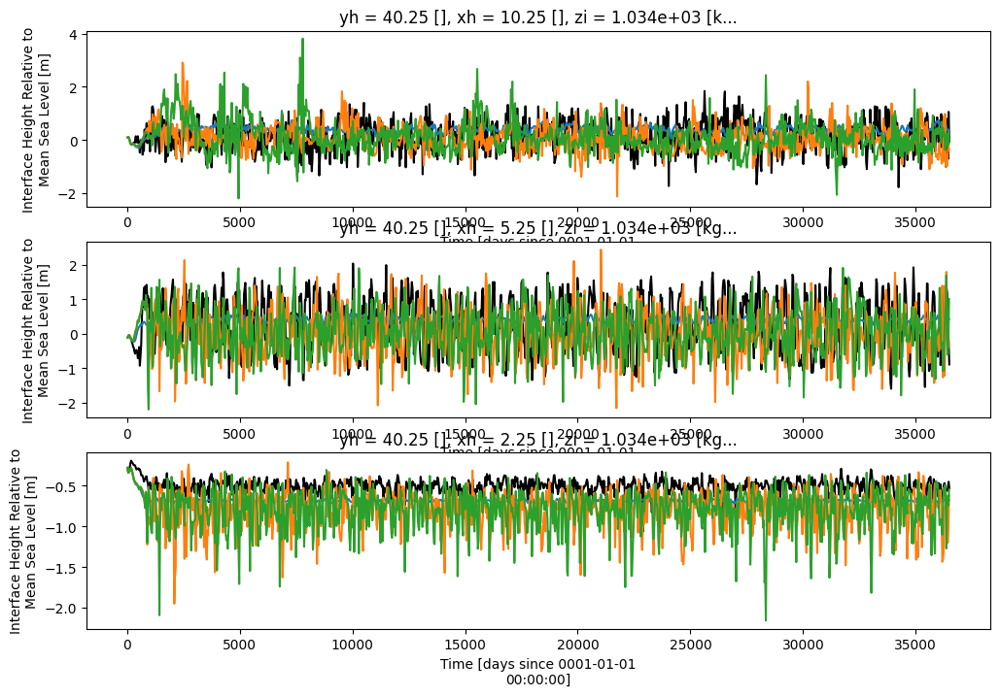

In [138]:
plt.figure(figsize=(12,8))
for j, xh, yh in ((1,10,40), (2,5,40), (3,2,40)):
    plt.subplot(3,1,j)
    e.sel(xh=xh, yh=yh, method='nearest').plot(color='k')
    ds['hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00'].e.isel(zi=0).sel(xh=xh, yh=yh, method='nearest').plot()
    ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04'].e.isel(zi=0).sel(xh=xh, yh=yh, method='nearest').plot()
    ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06'].e.isel(zi=0).sel(xh=xh, yh=yh, method='nearest').plot()

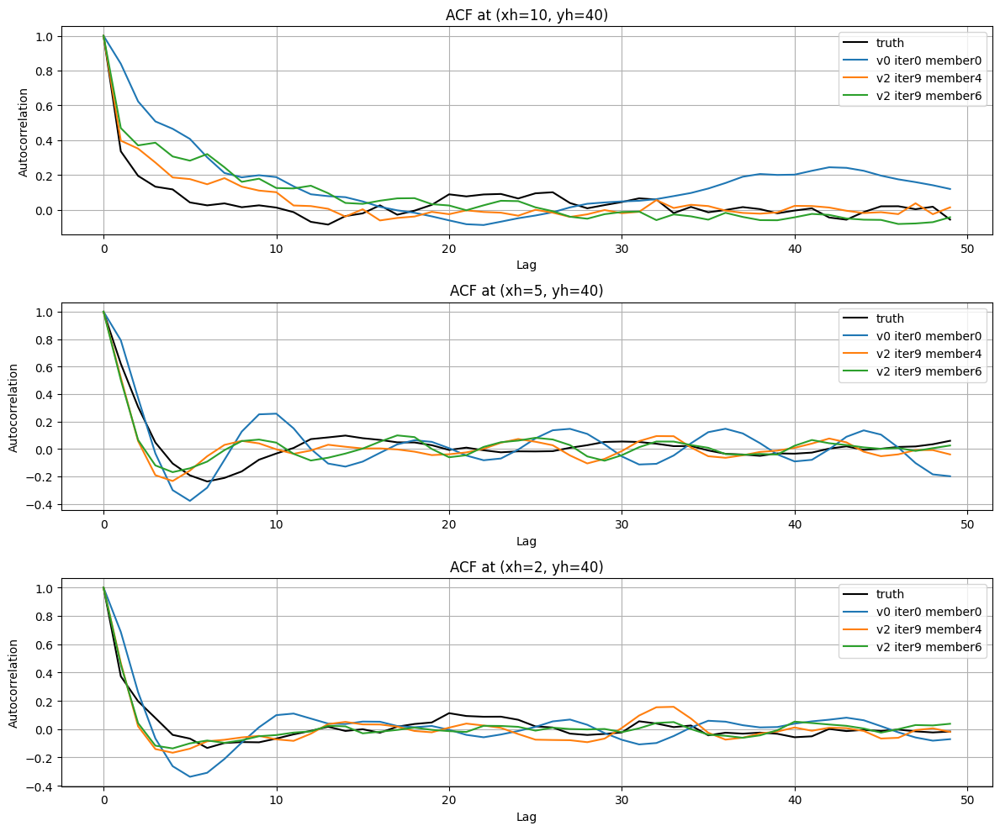

In [156]:
def acf(x, nlags=50):
    """Simple autocorrelation function."""
    x = x - np.nanmean(x)
    corr = np.correlate(x, x, mode='full')
    corr = corr[corr.size // 2:]
    return corr[:nlags] / corr[0]


plt.figure(figsize=(12,10))

for j, (xh, yh) in enumerate([(10,40), (5,40), (2,40)], start=1):

    # extract series
    x0 = e.sel(xh=xh, yh=yh, method='nearest').sel(Time=slice(3650,None)).values

    x1 = ds['hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00'] \
            .e.isel(zi=0).sel(xh=xh, yh=yh, method='nearest').sel(Time=slice(3650,None)).values

    x2 = ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04'] \
            .e.isel(zi=0).sel(xh=xh, yh=yh, method='nearest').sel(Time=slice(3650,None)).values

    x3 = ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06'] \
            .e.isel(zi=0).sel(xh=xh, yh=yh, method='nearest').sel(Time=slice(3650,None)).values

    # compute acf
    nlags = 50
    ac0 = acf(x0, nlags)
    ac1 = acf(x1, nlags)
    ac2 = acf(x2, nlags)
    ac3 = acf(x3, nlags)

    # plot
    plt.subplot(3, 1, j)
    plt.plot(ac0, label='truth', color='k')
    plt.plot(ac1, label='v0 iter0 member0')
    plt.plot(ac2, label='v2 iter9 member4')
    plt.plot(ac3, label='v2 iter9 member6')

    plt.title(f"ACF at (xh={xh}, yh={yh})")
    plt.xlabel("Lag")
    plt.ylabel("Autocorrelation")
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

Text(0, 0.5, 'yh')

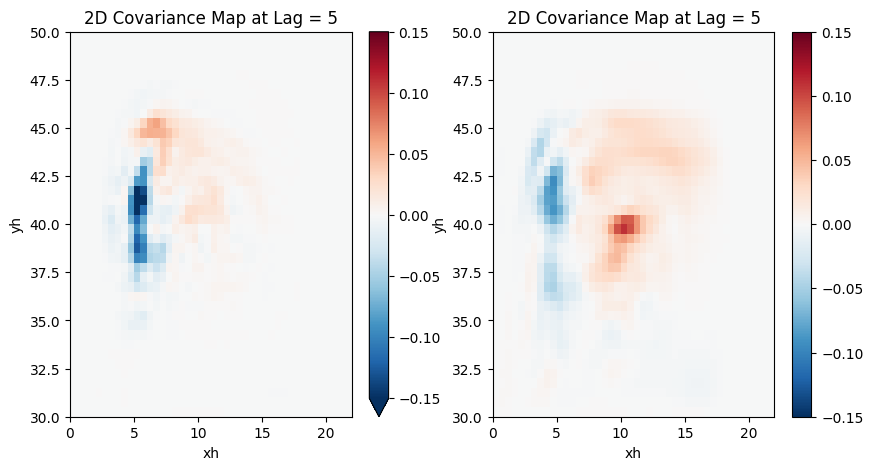

In [159]:
import numpy as np
import matplotlib.pyplot as plt

def covariance_at_lag(da, lag):
    """
    Compute covariance field Cov(x(t), x(t+lag)) for all (xh,yh).
    da: xarray DataArray with dimensions (Time, yh, xh)
    lag: integer (number of time steps)
    """
    # Align arrays x(t) and x(t+lag)
    n = len(da.Time)
    x = da.isel(Time=slice(0,n-lag)).values       # t = 0 ... T-lag-1
    y = da.isel(Time=slice(lag, n)).values      # t+lag = lag ... T-1

    # Remove time means at each grid point
    x = x - np.nanmean(x, axis=0, keepdims=True)
    y = y - np.nanmean(y, axis=0, keepdims=True)

    # Covariance along time
    cov = np.nanmean(x * y, axis=0)

    return xr.DataArray(cov, dims=['yh', 'xh'], coords={'xh': da.xh, 'yh': da.yh})   # shape (yh, xh)


# ============================
# Choose lag for mapping
# ============================
lag_idx = 5   # for example, 30 timesteps (~1 month if daily)
vmin=-0.15
vmax=0.15

# Use your "truth" dataset for covariance map
da = e.sel(Time=slice(3650, None))   # trimming spin-up

# Compute covariance field
cov_map = covariance_at_lag(da, lag_idx)

da = ds['hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06'].e.isel(zi=0).sel(Time=slice(3650,None))
cov_map_coarse = covariance_at_lag(da, lag_idx)

# ============================
# Plot 2D spatial covariance map
# ============================
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
cov_map.plot.pcolormesh(shading='auto', cmap='RdBu_r', vmin=vmin, vmax=vmax)
plt.title(f"2D Covariance Map at Lag = {lag_idx}")
plt.xlabel("xh")
plt.ylabel("yh")

plt.subplot(1,2,2)
cov_map_coarse.plot.pcolormesh(shading='auto', cmap='RdBu_r', vmin=vmin, vmax=vmax)
plt.title(f"2D Covariance Map at Lag = {lag_idx}")
plt.xlabel("xh")
plt.ylabel("yh")


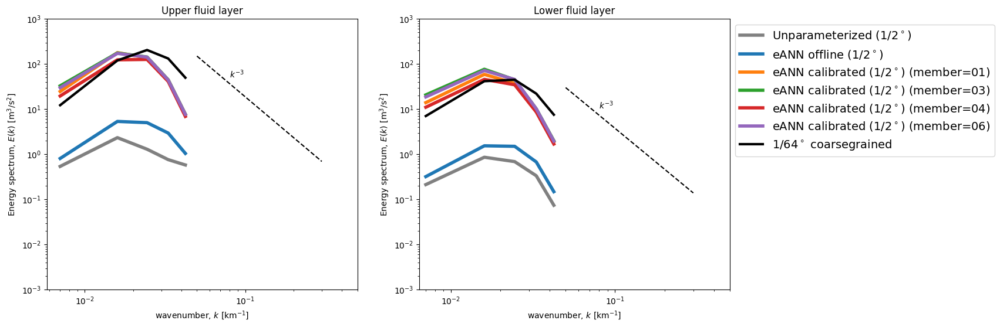

In [26]:
ds.plot_KE_spectrum(['R2', 'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-01',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-03',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-04',
            'hundred-years-R2-old-algorithm-v2-iteration-09-R2-ens-member-06',
            'R64_R2'],
           labels=['Unparameterized ($1/2^\circ$)', 'eANN offline ($1/2^\circ$)', 
           'eANN calibrated ($1/2^\circ$) (member=01)',
           'eANN calibrated ($1/2^\circ$) (member=03)',
           'eANN calibrated ($1/2^\circ$) (member=04)',
           'eANN calibrated ($1/2^\circ$) (member=06)',
           '$1/64^\circ$ coarsegrained'])

# Was 10-year runs ensemble same similar?

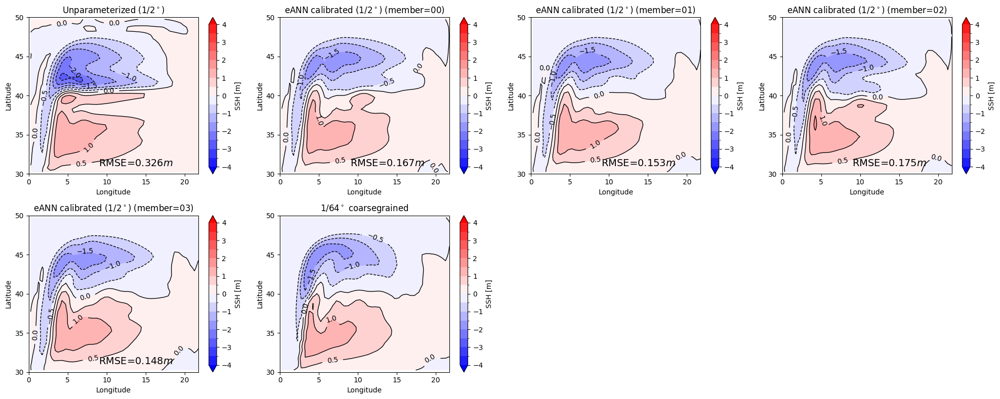

In [24]:
ds.plot_ssh(['R2',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-00',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-01',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-02',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-03',
            'R64_R2'],
           labels=['Unparameterized ($1/2^\circ$)',
           'eANN calibrated ($1/2^\circ$) (member=00)',
           'eANN calibrated ($1/2^\circ$) (member=01)',
           'eANN calibrated ($1/2^\circ$) (member=02)',
           'eANN calibrated ($1/2^\circ$) (member=03)',
           '$1/64^\circ$ coarsegrained'], ncols=4)

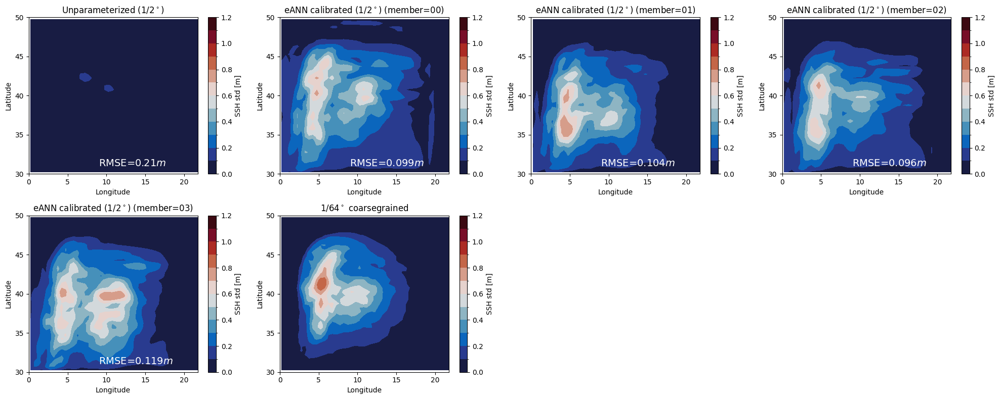

In [25]:
ds.plot_ssh_std(['R2',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-00',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-01',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-02',
            'variability-R2-eANN-data-misfit-iteration-09-ens-member-03',
            'R64_R2'],
           labels=['Unparameterized ($1/2^\circ$)',
           'eANN calibrated ($1/2^\circ$) (member=00)',
           'eANN calibrated ($1/2^\circ$) (member=01)',
           'eANN calibrated ($1/2^\circ$) (member=02)',
           'eANN calibrated ($1/2^\circ$) (member=03)',
           '$1/64^\circ$ coarsegrained'], ncols=4, target='R64_R2')

# Prepare dataset with KE/APE mean/std 

In [51]:
ds.remesh('R16', 'R2')

Experiment R16 coarsegrained to R2 is created. Its identificator=R16_R2


In [52]:
KE = ds['R16'].KE_joul_series.compute()
KE_R2 = ds['R16_R2'].KE_joul_series.compute()

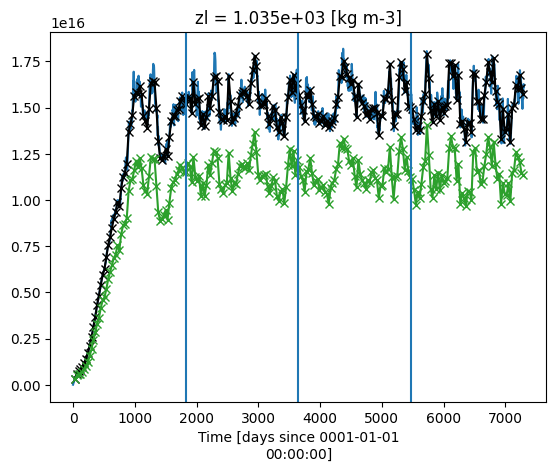

In [56]:
ds['R16'].series.KE.isel(Layer=0).plot()
KE.isel(zl=0).plot(color='k', marker='x')
KE_R2.isel(zl=0).plot(color='tab:green', marker='x')
plt.axvline(x=365*5)
plt.axvline(x=365*10)
plt.axvline(x=365*15)

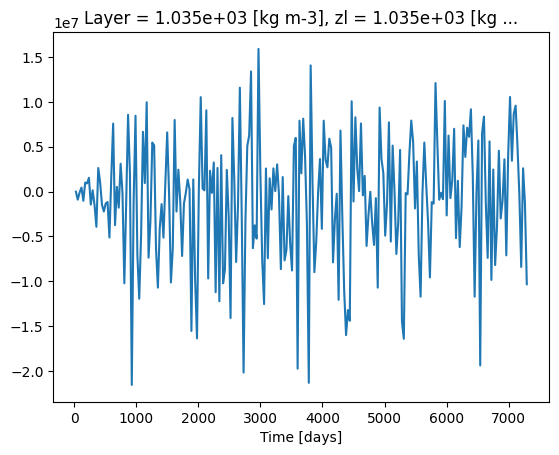

In [39]:
(ds['R16'].series.KE.isel(Layer=0) - KE.isel(zl=0)).plot()

In [48]:
KE_mean_snapshots = KE.sel(Time=slice(3650,None)).mean('Time')
KE_mean_series = ds['R16'].series.KE.sel(Time=slice(3650,None)).mean('Time')

KE_std_snapshots = KE.sel(Time=slice(3650,None)).std('Time')
KE_std_series = ds['R16'].series.KE.sel(Time=slice(3650,None)).std('Time')

In [49]:
(KE_mean_snapshots - KE_mean_series.values) / KE_mean_series.values

<xarray.DataArray (zl: 2)> Size: 16B
array([-0.00176052,  0.00110341])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [50]:
(KE_std_snapshots - KE_std_series.values) / KE_std_series.values

<xarray.DataArray (zl: 2)> Size: 16B
array([ 0.03885692, -0.01459509])
Coordinates:
  * zl       (zl) float64 16B 1.035e+03 1.036e+03

In [83]:
APE = xr.concat([ds['R16'].PE_ssh_series, ds['R16'].PE_joul_series], dim='Interface').compute()
APE_R2 = xr.concat([ds['R16_R2'].PE_ssh_series, ds['R16_R2'].PE_joul_series], dim='Interface').compute()

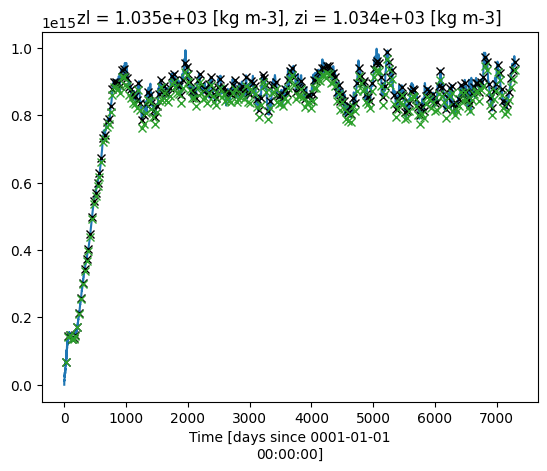

In [84]:
ds['R16'].series.APE.isel(Interface=0).plot()
APE[0].plot(color='k', marker='x', ls='')
APE_R2[0].plot(color='tab:green', marker='x', ls='')

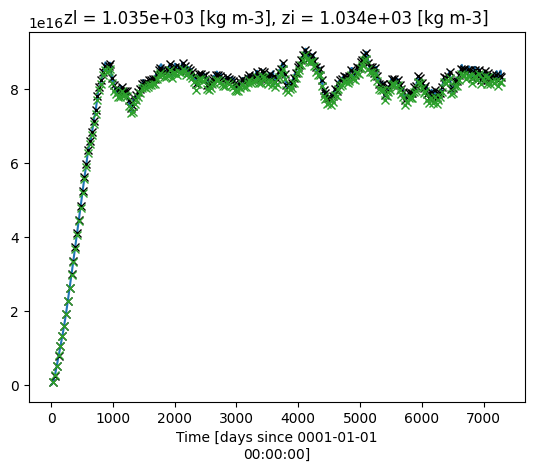

In [85]:
ds['R16'].series.APE.isel(Interface=1).plot()
APE[1].plot(color='k', marker='x', ls='')
APE_R2[1].plot(color='tab:green', marker='x', ls='')

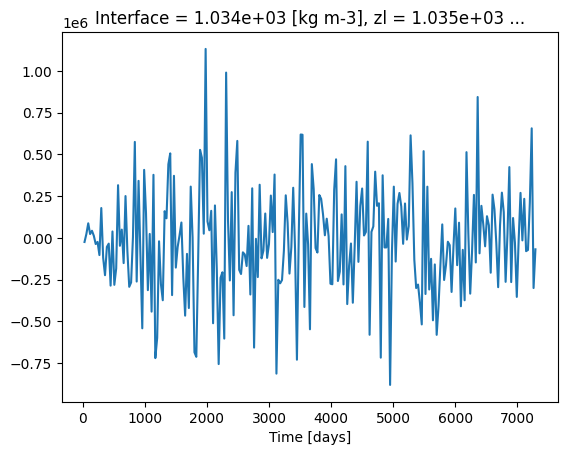

In [81]:
(ds['R16'].series.APE.isel(Interface=0) - APE[0]).plot()

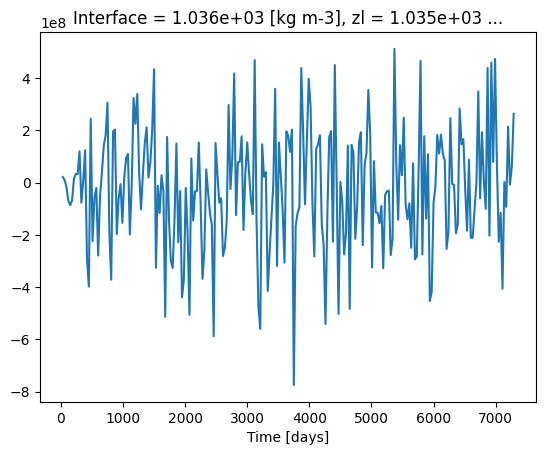

In [82]:
(ds['R16'].series.APE.isel(Interface=1) - APE[1]).plot()

# Updating dataset with actual values

In [5]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')
ds.remesh('R64', 'R2')
ds.remesh('R32', 'R2')

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2
Experiment R32 coarsegrained to R2 is created. Its identificator=R32_R2


In [ ]:
exp = 'R64_R2'
KE_coarse = ds[exp].KE_joul_series.compute()

In [ ]:
APE_coarse = xr.concat([ds[exp].PE_ssh_series.drop_vars(['zi', 'zl']), ds[exp].PE_joul_series], dim='zi').compute()

In [ ]:
dataset = xr.open_dataset('../scripts/R64_R2/full.nc').load()

In [113]:
dataset['KE_mean'] = KE_coarse.sel(Time=slice(1825,3650)).mean('Time')
dataset['APE_mean'] = APE_coarse.sel(Time=slice(1825,3650)).mean('Time')

dataset['KE_std'] = KE_coarse.sel(Time=slice(1825,3650)).std('Time')
dataset['APE_std'] = APE_coarse.sel(Time=slice(1825,3650)).std('Time')

In [117]:
print(dataset['KE_mean'].values)
print(dataset['KE_std'].values)

[1.11716683e+16 9.30621791e+14]
[9.12940575e+14 1.94232172e+14]


In [118]:
print(dataset['APE_mean'].values)
print(dataset['APE_std'].values)

[8.45310088e+14 8.07539760e+16]
[2.93335490e+13 2.10808303e+15]


In [122]:
dataset['KE_mean_var'] = xr.concat(
    [
        KE_coarse.sel(Time=slice(1825,3650)).mean('Time'),
        KE_coarse.sel(Time=slice(3650,5475)).mean('Time'),
        KE_coarse.sel(Time=slice(5475,7300)).mean('Time'),
    ],
    dim='segment'
).var('segment')

dataset['APE_mean_var'] = xr.concat(
    [
        APE_coarse.sel(Time=slice(1825,3650)).mean('Time'),
        APE_coarse.sel(Time=slice(3650,5475)).mean('Time'),
        APE_coarse.sel(Time=slice(5475,7300)).mean('Time'),
    ],
    dim='segment'
).var('segment')

dataset['KE_std_var'] = xr.concat(
    [
        KE_coarse.sel(Time=slice(1825,3650)).std('Time'),
        KE_coarse.sel(Time=slice(3650,5475)).std('Time'),
        KE_coarse.sel(Time=slice(5475,7300)).std('Time'),
    ],
    dim='segment'
).var('segment')

dataset['APE_std_var'] = xr.concat(
    [
        APE_coarse.sel(Time=slice(1825,3650)).std('Time'),
        APE_coarse.sel(Time=slice(3650,5475)).std('Time'),
        APE_coarse.sel(Time=slice(5475,7300)).std('Time'),
    ],
    dim='segment'
).var('segment')


In [123]:
print(np.sqrt(dataset['KE_mean_var']).values)
print(np.sqrt(dataset['KE_std_var']).values)

[1.12828341e+14 7.27255319e+12]
[9.10651584e+13 5.57842524e+12]


In [124]:
print(np.sqrt(dataset['APE_mean_var']).values)
print(np.sqrt(dataset['APE_std_var']).values)

[8.81676205e+12 9.79850972e+14]
[5.95546332e+12 4.69962727e+14]


In [129]:
dataset.astype('float32').to_netcdf('../scripts/R64_R2/series.nc')

# Emulator or trying different loss functions

In [6]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2-old-algorithm-series/metrics.nc').squeeze()
mask = xr.where(np.isnan(metrics.KE_mean.isel(zl=0)), np.nan, 1)

In [7]:
hires = xr.open_dataset('../scripts/R64_R2/series.nc')

In [12]:
loss = ((metrics.KE_mean.sum('zl') - hires.KE_mean.sum('zl'))**2/hires.KE_mean_var.sum('zl') + \
       (metrics.KE_std.sum('zl') - hires.KE_std.sum('zl'))**2/hires.KE_std_var.sum('zl') + \
       (metrics.APE_mean.sum('zl') - hires.APE_mean.sum('zi'))**2/hires.APE_mean_var.sum('zi') + \
       (metrics.APE_std.sum('zl') - hires.APE_std.sum('zi'))**2/hires.APE_std_var.sum('zi')) * mask / 4

In [21]:
loss.min('ens')

<xarray.DataArray (iter: 10)> Size: 80B
array([ 87.80466461,  88.45756531, 147.69760132, 133.70140076,
       152.85647583, 119.01347351, 127.52254486,          nan,
                nan,          nan])
Dimensions without coordinates: iter

In [20]:
loss[0][59]

<xarray.DataArray ()> Size: 8B
array(87.80466461)

In [33]:
loss = (((metrics.KE_mean - hires.KE_mean)**2/hires.KE_mean_var).sum('zl') + \
       ((metrics.KE_std - hires.KE_std)**2/hires.KE_std_var).sum('zl') + \
       ((metrics.APE_mean.rename({'zl':'zi'}) - hires.APE_mean)**2/hires.APE_mean_var).sum('zi') + \
       ((metrics.APE_std.rename({'zl':'zi'}) - hires.APE_std)**2/hires.APE_std_var).sum('zi')) * mask / 8

In [41]:
print(loss.argmin())
print(loss.min())

<xarray.DataArray ()> Size: 8B
array(575)
<xarray.DataArray ()> Size: 8B
array(331.35321045)


In [46]:
loss[5][75]

<xarray.DataArray ()> Size: 8B
array(331.35321045)

Text(0, 0.5, 'APE STD [J]')

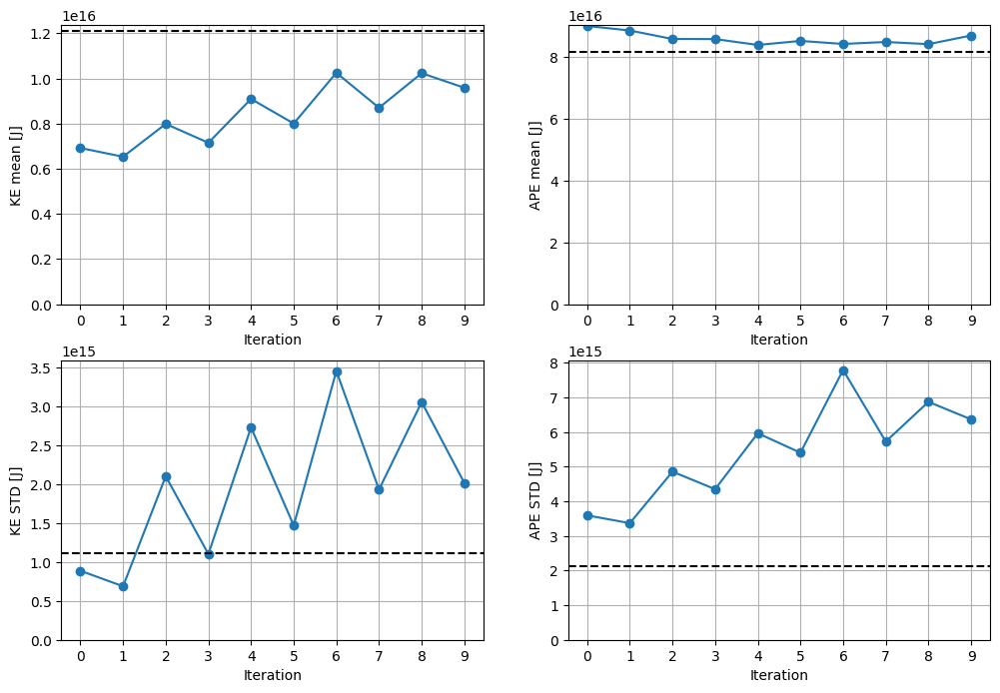

In [8]:
mask = xr.where(np.isnan(metrics.KE_mean.isel(zl=0)), np.nan, 1)
KE = metrics.KE_mean.sum('zl') * mask
APE = metrics.APE_mean.sum('zl') * mask

KE_std = metrics.KE_std.sum('zl') * mask
APE_std = metrics.APE_std.sum('zl') * mask

plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
KE.mean(['ens']).plot(marker='o')
plt.axhline(y=hires.KE_mean.sum('zl'), color='k', ls='--')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.ylabel('KE mean [J]')

plt.subplot(2,2,2)
APE.mean('ens').plot(marker='o')
plt.axhline(y=hires.APE_mean.sum('zi'), color='k', ls='--')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.ylabel('APE mean [J]')

plt.subplot(2,2,3)
KE_std.mean('ens').plot(marker='o')
plt.axhline(y=hires.KE_std.sum('zl'), color='k', ls='--')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.ylabel('KE STD [J]')

plt.subplot(2,2,4)
APE_std.mean('ens').plot(marker='o')
plt.axhline(y=hires.APE_std.sum('zi'), color='k', ls='--')
plt.ylim([0,None])
plt.xticks(np.arange(10))
plt.grid()
plt.xlabel('Iteration')
plt.ylabel('APE STD [J]')


In [138]:
def plot(iteration=0):

    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec

    # Precompute all variables and their true/reference values
    data = {
        "KE": {
            "values": KE.isel(iter=iteration).values.ravel(),
            "label": "KE [J]",
            "true": float(hires.KE_mean.sum("zl")),
            "lim": [0.4e+16, 2e+16]
        },
        "APE": {
            "values": APE.isel(iter=iteration).values.ravel(),
            "label": "APE [J]",
            "true": float(hires.APE_mean.sum("zi")),
            "lim": [0.5e+17, 1.5e+17]
        },
        "KE_std": {
            "values": KE_std.isel(iter=iteration).values.ravel(),
            "label": "KE STD [J]",
            "true": float(hires.KE_std.sum("zl")),
            "lim": [-0.2e+16, 1e+16]
        },
        "APE_std": {
            "values": APE_std.isel(iter=iteration).values.ravel(),
            "label": "APE STD [J]",
            "true": float(hires.APE_std.sum("zi")),
            "lim": [-0.1e+16, 2e+16]
        },
    }

    names = list(data.keys())


    pairs = [
        ("KE", "APE"),
        ("KE", "KE_std"), ("APE", "KE_std"),
        ("KE", "APE_std"), ("APE", "APE_std"), ("KE_std", "APE_std")
    ]

    # Define a triangular layout: rows have increasing number of panels
    row_layout = [1, 2, 3]  # number of panels in each row
    fig = plt.figure(figsize=(12, 10))
    gs = gridspec.GridSpec(3, 3, figure=fig, wspace=0.3, hspace=0.3)

    panel_idx = 0
    for row, n_panels in enumerate(row_layout):
        for col in range(n_panels):
            ax = fig.add_subplot(gs[row, col])
            xname, yname = pairs[panel_idx]
            ax.scatter(data[xname]["values"], data[yname]["values"], s=15)
            ax.axvline(data[xname]["true"], color='k', ls='--')
            ax.axhline(data[yname]["true"], color='k', ls='--')
            ax.set_xlabel(data[xname]["label"])
            ax.set_ylabel(data[yname]["label"])
            ax.set_xlim(data[xname]["lim"])
            ax.set_ylim(data[yname]["lim"])
            panel_idx += 1

    plt.suptitle(f'Iteration = {iteration}', y=0.95)
    plt.tight_layout()


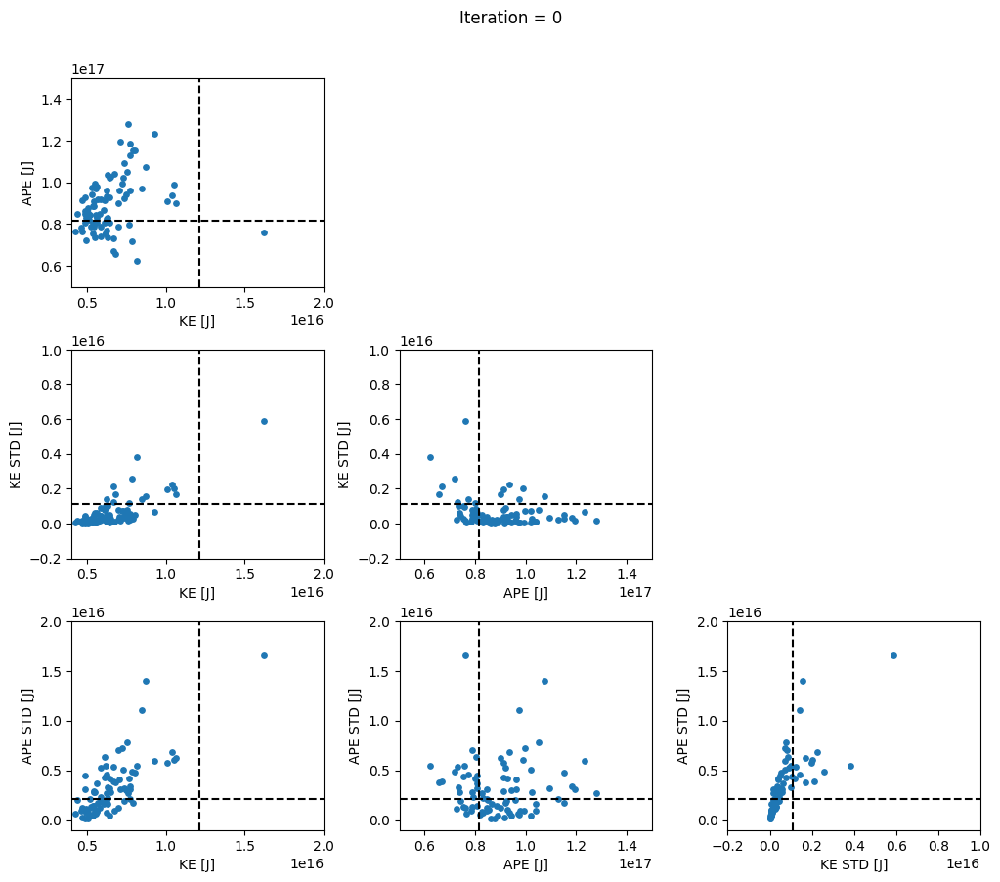

In [139]:
plot(iteration=0)

In [142]:
create_animation_ffmpeg(plot, range(10), filename='energetics_scatter.mp4', FPS=1)

Frames already exists in folder .ffmpeg/energetics_scatter


Frames are not updated

Native resolution of snapshots is used: 2048x1806

Animation energetics_scatter.mp4 at FPS=1 will last for 10.0 seconds. The frames are saved to 
.ffmpeg/energetics_scatter

Running the command:
cd /home/pp2681/calibration/notebooks; ffmpeg -y -framerate 1 -i .ffmpeg/energetics_scatter/frame-%d.png -s:v 2048x1806 -c:v libx264 -profile:v high -crf 20 -pix_fmt yuv420p energetics_scatter.mp4


ffmpeg: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /.singularity.d/libs/libGLX.so.0)
ffmpeg: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /.singularity.d/libs/libGLdispatch.so.0)


In [156]:
hires.KE_mean.sum('zl')/ds['R32'].series.KE.sel(Time=slice(3650,None)).sum("Layer").mean("Time")

<xarray.DataArray ()> Size: 8B
array(0.71523325)

In [157]:
hires.APE_mean.sum('zi')/ds['R32'].series.APE.sel(Time=slice(3650,None)).sum("Interface").mean("Time")

<xarray.DataArray ()> Size: 8B
array(0.99150569)

# Is ANN ok at 1/4 resolution?

In [3]:
metrics = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration/hundred-years/R2_R4_R8/metrics.nc')

In [4]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/calibration', additional_subfolder='output')

In [5]:
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/generalization', additional_subfolder='output')
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Apr2023/generalization', additional_subfolder='output')
ds +=  CollectionOfExperiments.init_folder('/scratch/pp2681/mom6//Wenda-WENO', additional_subfolder='output')

In [6]:
ds.remesh('R64', 'R4')

Experiment R64 coarsegrained to R4 is created. Its identificator=R64_R4


In [7]:
ds.remesh('R64', 'R8')

Experiment R64 coarsegrained to R8 is created. Its identificator=R64_R8


In [8]:
ds.remesh('R64', 'R2')

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2


In [9]:
ds.remesh('R32', 'R4')

Experiment R32 coarsegrained to R4 is created. Its identificator=R32_R4


In [10]:
ds.remesh('R32', 'R2')

Experiment R32 coarsegrained to R2 is created. Its identificator=R32_R2


In [11]:
ds.remesh('R32', 'R8')

Experiment R32 coarsegrained to R8 is created. Its identificator=R32_R8


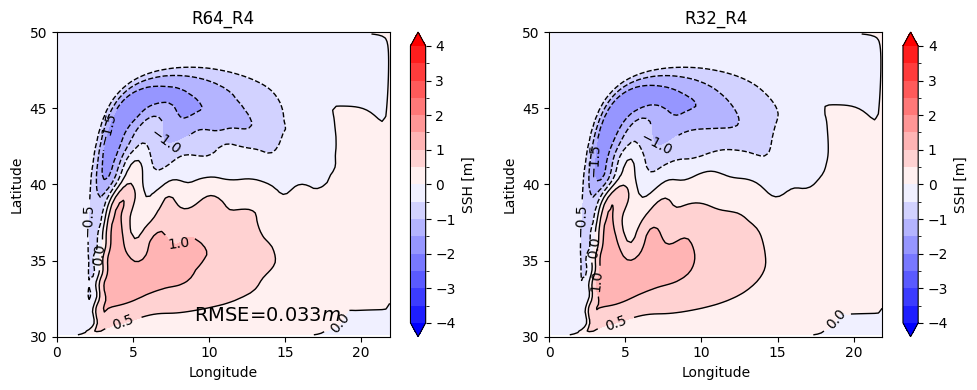

In [136]:
ds.plot_ssh(['R64_R4', 'R32_R4'])

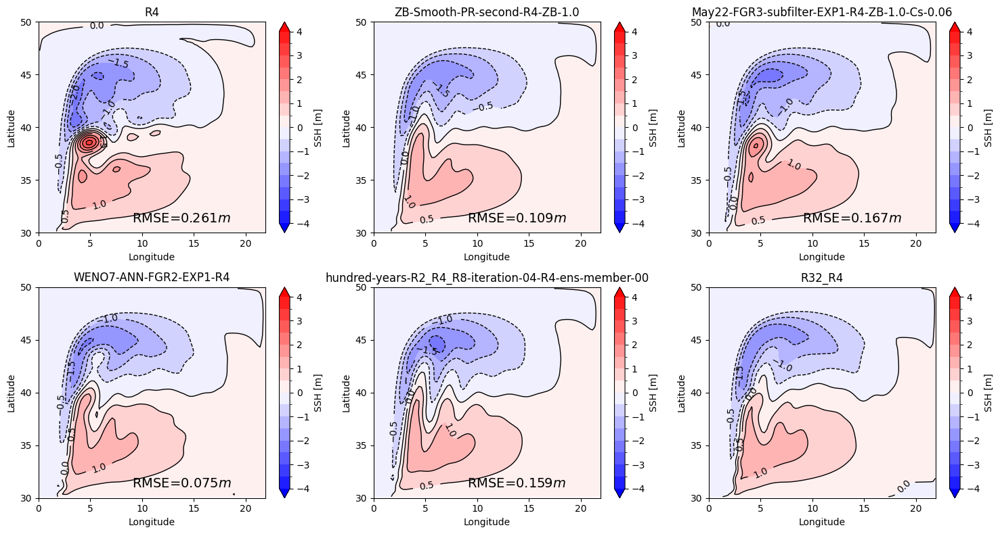

In [12]:
ds.plot_ssh(['R4', 'ZB-Smooth-PR-second-R4-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R4', 'hundred-years-R2_R4_R8-iteration-04-R4-ens-member-00', 'R32_R4'])

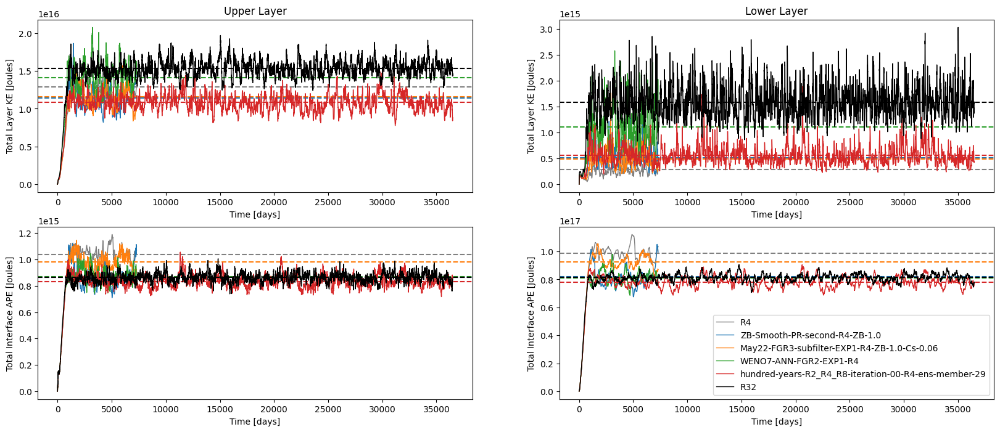

In [233]:
ds.plot_series(['R4', 'ZB-Smooth-PR-second-R4-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R4', 'hundred-years-R2_R4_R8-iteration-00-R4-ens-member-29', 'R32'])

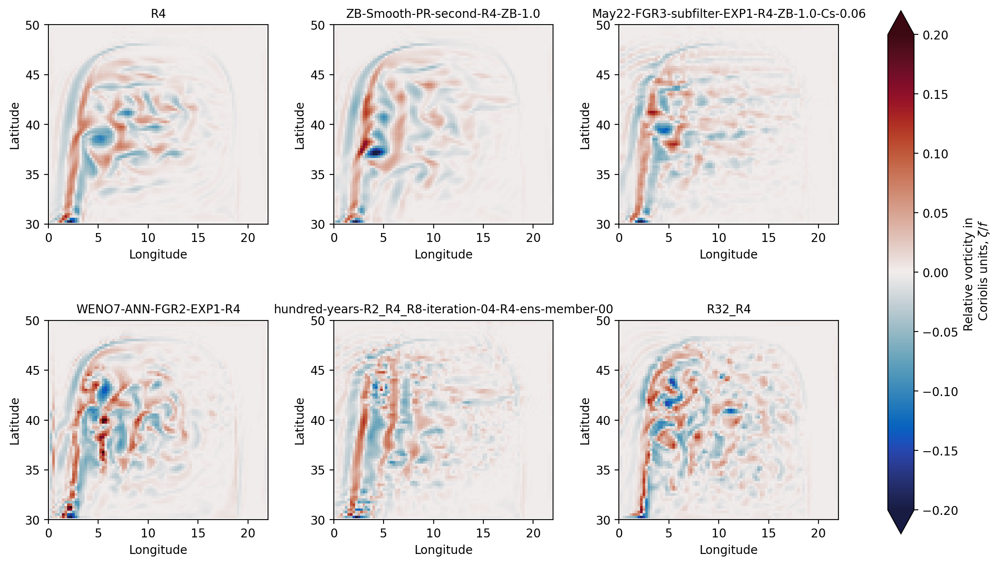

In [19]:
ds.plot_RV(['R4', 'ZB-Smooth-PR-second-R4-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R4', 'hundred-years-R2_R4_R8-iteration-04-R4-ens-member-00', 'R32_R4'])

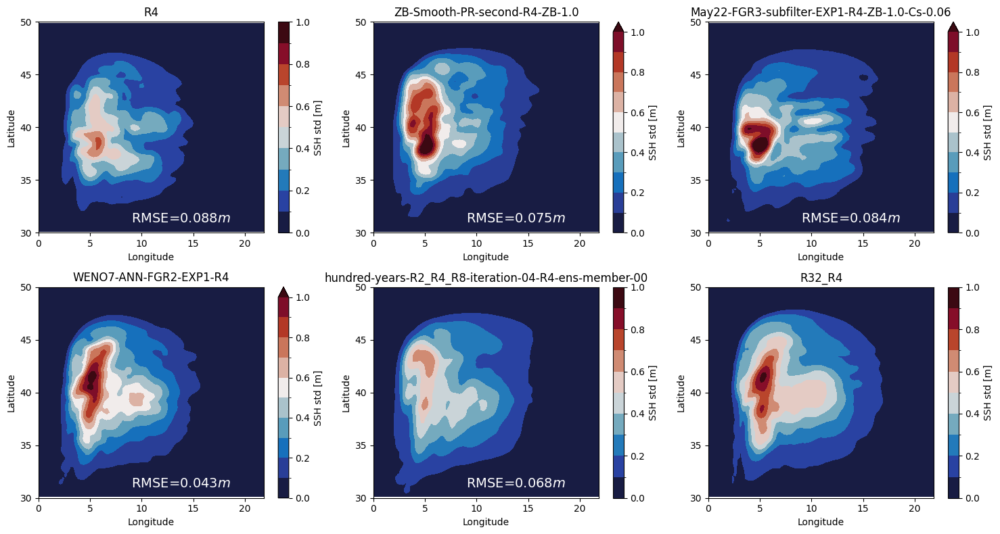

In [14]:
ds.plot_ssh_std(['R4', 'ZB-Smooth-PR-second-R4-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R4', 'hundred-years-R2_R4_R8-iteration-04-R4-ens-member-00', 'R32_R4'], target='R32_R4')

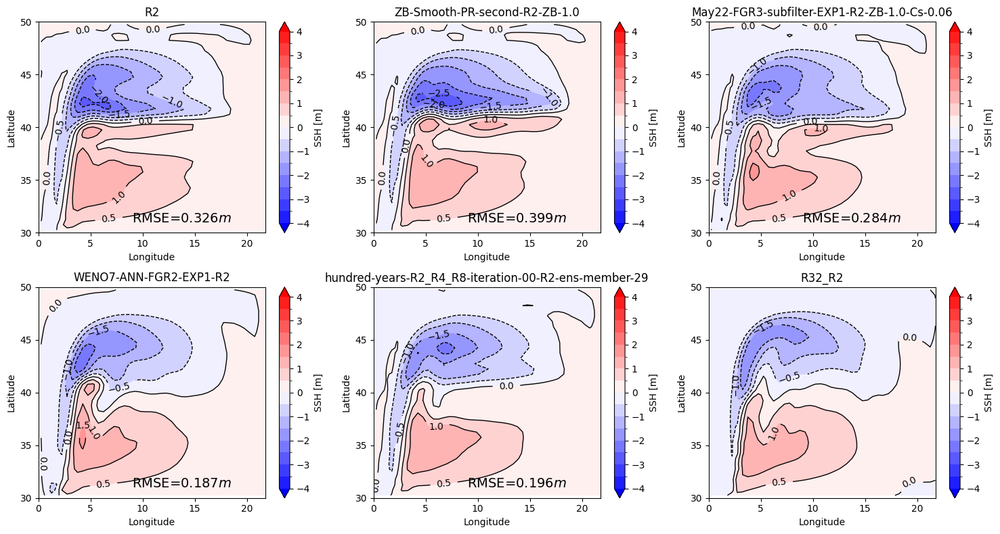

In [229]:
ds.plot_ssh(['R2', 'ZB-Smooth-PR-second-R2-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R2',  'hundred-years-R2_R4_R8-iteration-00-R2-ens-member-29', 'R32_R2'])

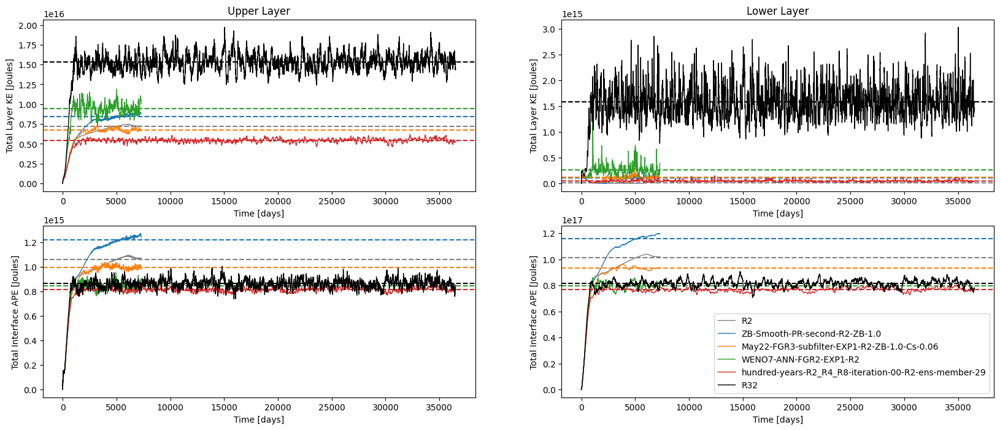

In [234]:
ds.plot_series(['R2', 'ZB-Smooth-PR-second-R2-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R2',  'hundred-years-R2_R4_R8-iteration-00-R2-ens-member-29', 'R32'])

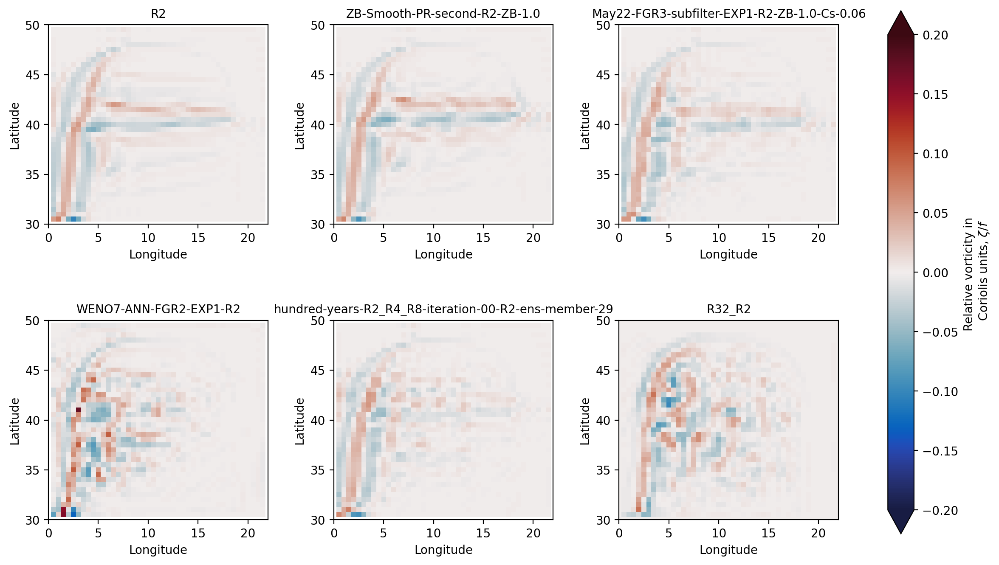

In [230]:
ds.plot_RV(['R2', 'ZB-Smooth-PR-second-R2-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R2',  'hundred-years-R2_R4_R8-iteration-00-R2-ens-member-29', 'R32_R2'])

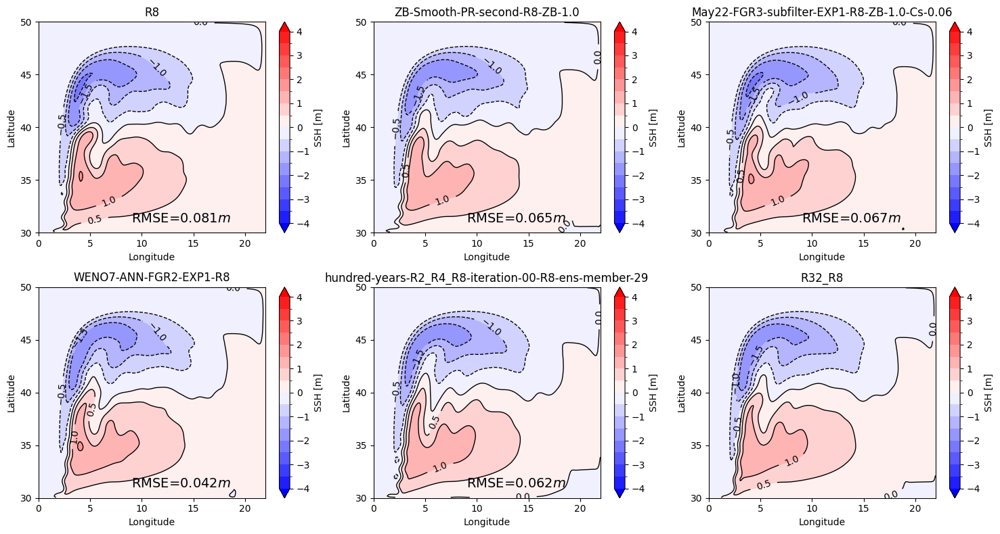

In [231]:
ds.plot_ssh(['R8', 'ZB-Smooth-PR-second-R8-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R8', 'hundred-years-R2_R4_R8-iteration-00-R8-ens-member-29', 'R32_R8'])

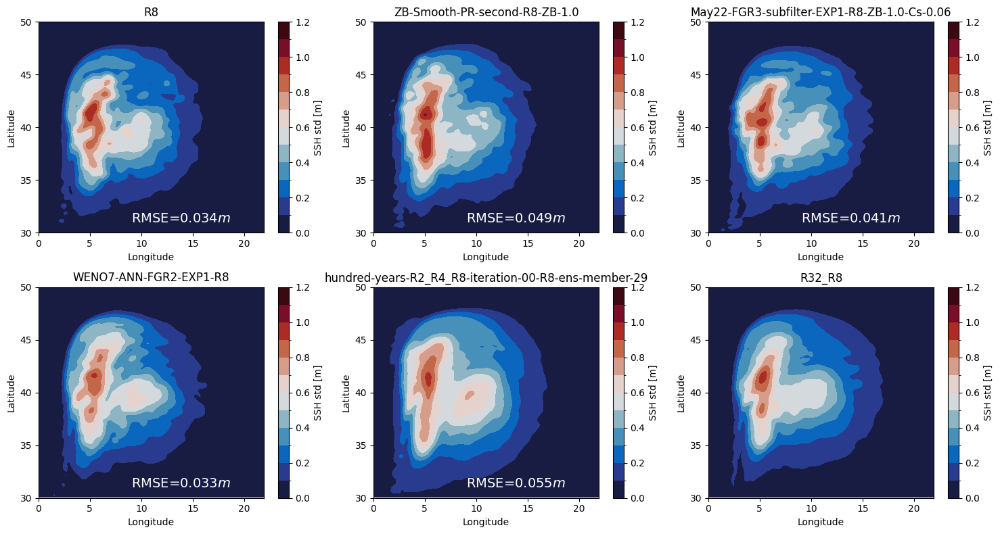

In [10]:
ds.plot_ssh_std(['R8', 'ZB-Smooth-PR-second-R8-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R8', 'hundred-years-R2_R4_R8-iteration-00-R8-ens-member-29', 'R32_R8'], target='R32_R8')

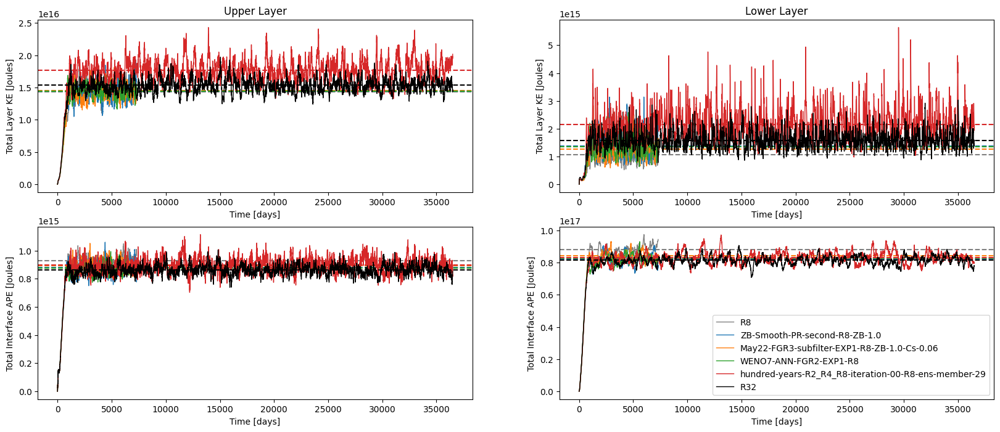

In [11]:
ds.plot_series(['R8', 'ZB-Smooth-PR-second-R8-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R8', 'hundred-years-R2_R4_R8-iteration-00-R8-ens-member-29', 'R32'])

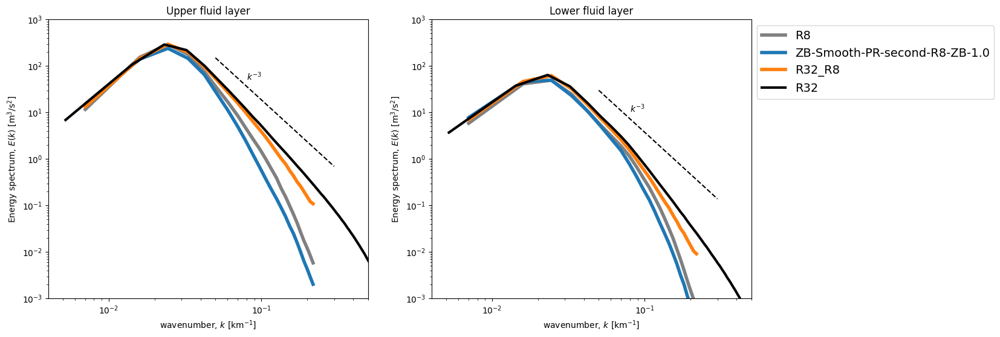

In [16]:
ds.plot_KE_spectrum(['R8', 'ZB-Smooth-PR-second-R8-ZB-1.0', 'R32_R8', 'R32']);

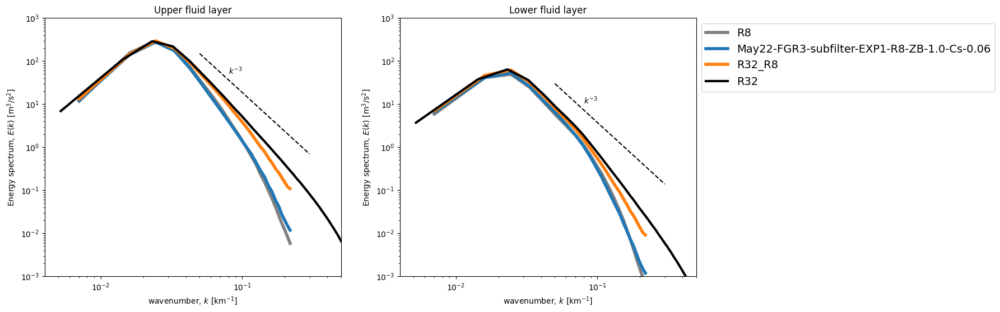

In [20]:
ds.plot_KE_spectrum(['R8', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'R32_R8', 'R32']);

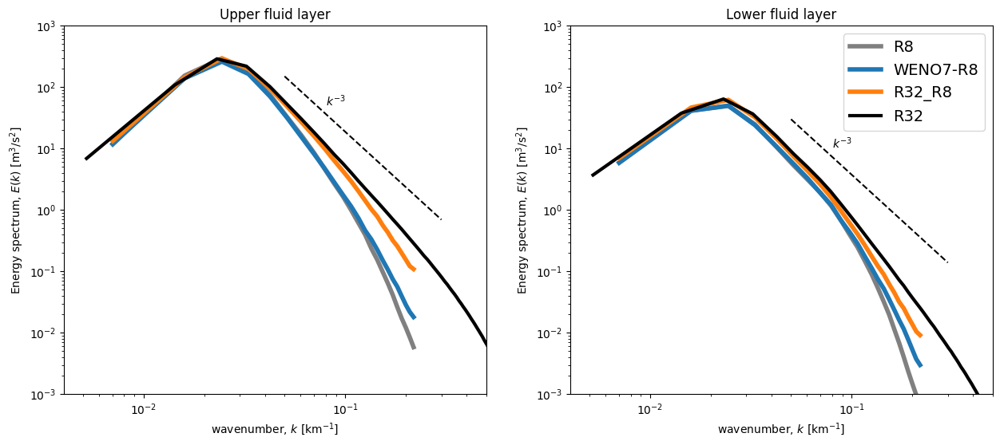

In [25]:
ds.plot_KE_spectrum(['R8','WENO7-R8', 'R32_R8', 'R32']);

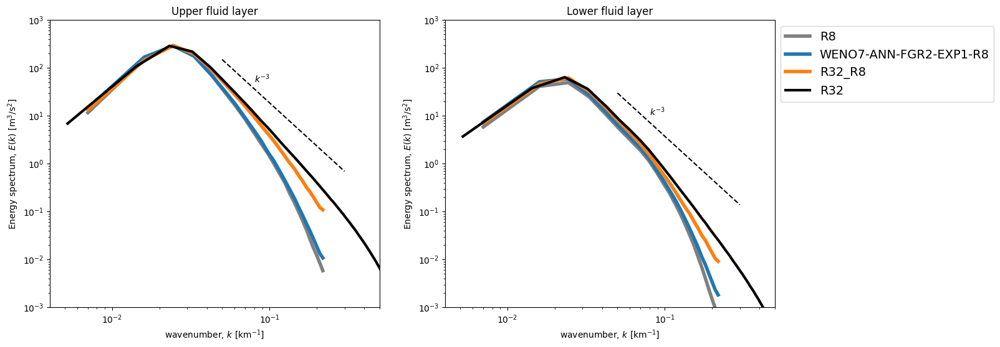

In [24]:
ds.plot_KE_spectrum(['R8','WENO7-ANN-FGR2-EXP1-R8', 'R32_R8', 'R32']);

In [ ]:
ds.plot_KE_spectrum(['R8', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'R32_R8', 'R32']);

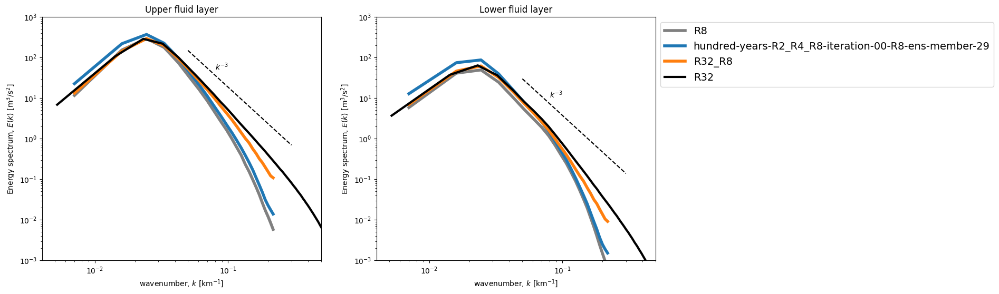

In [27]:
ds.plot_KE_spectrum(['R8', 'hundred-years-R2_R4_R8-iteration-00-R8-ens-member-29', 'R32_R8', 'R32']);

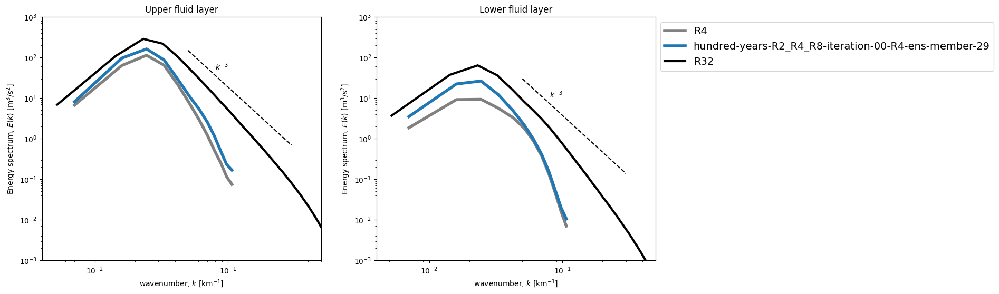

In [28]:
ds.plot_KE_spectrum(['R4', 'hundred-years-R2_R4_R8-iteration-00-R4-ens-member-29', 'R32']);

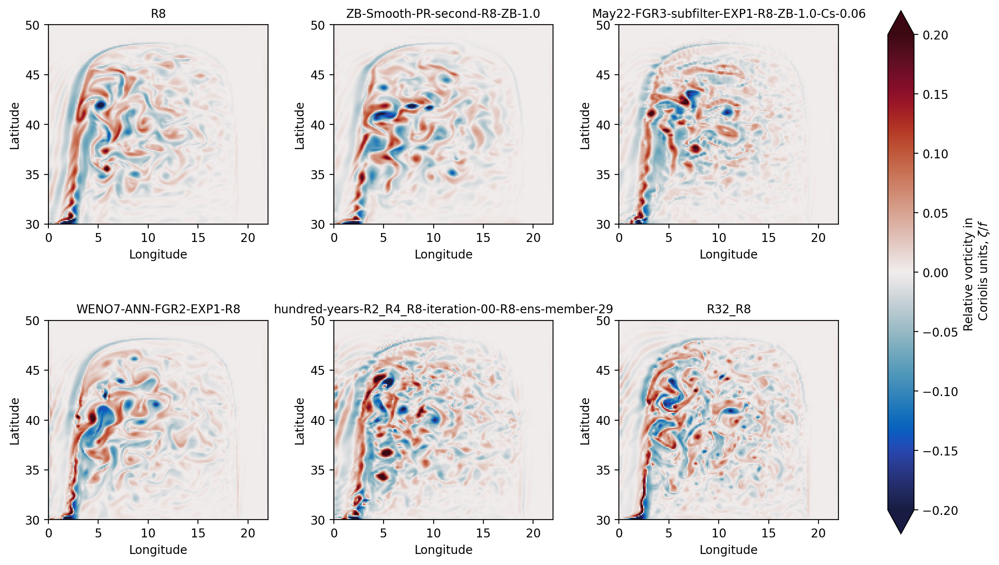

In [232]:
ds.plot_RV(['R8', 'ZB-Smooth-PR-second-R8-ZB-1.0', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'WENO7-ANN-FGR2-EXP1-R8', 'hundred-years-R2_R4_R8-iteration-00-R8-ens-member-29', 'R32_R8'])

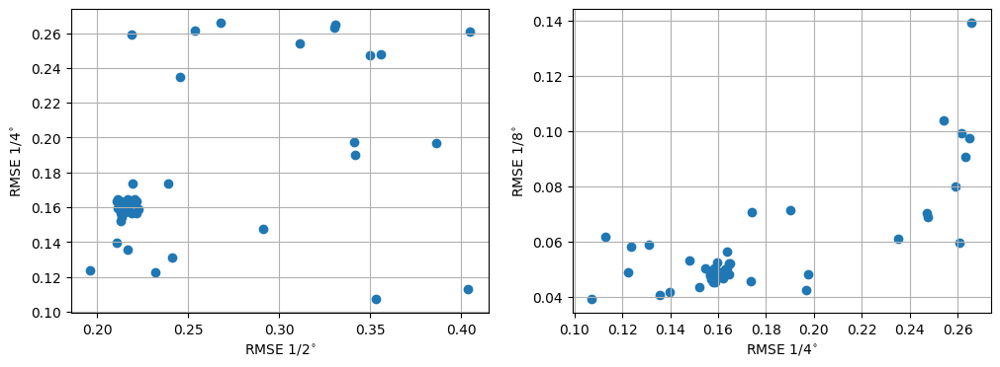

In [172]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)

plt.scatter(metrics.RMSE_e_mean.isel(res=0).values.ravel(), metrics.RMSE_e_mean.isel(res=1).values.ravel())
plt.xlabel('RMSE $1/2^{\circ}$')
plt.ylabel('RMSE $1/4^{\circ}$')
plt.grid()

plt.subplot(1,2,2)

plt.scatter(metrics.RMSE_e_mean.isel(res=1).values.ravel(), metrics.RMSE_e_mean.isel(res=2).values.ravel())
plt.xlabel('RMSE $1/4^{\circ}$')
plt.ylabel('RMSE $1/8^{\circ}$')
plt.grid()

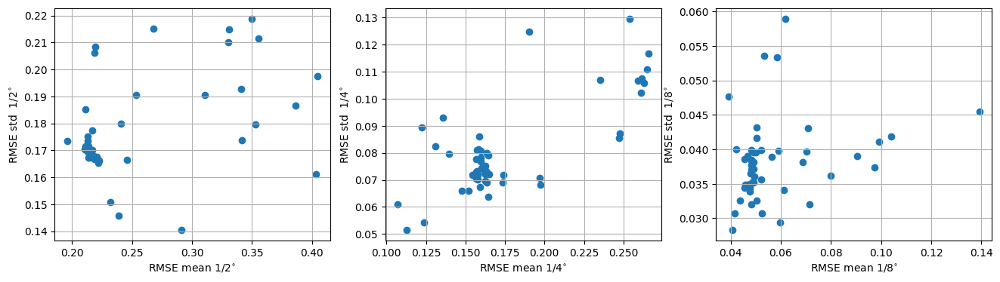

In [205]:
plt.figure(figsize=(16,4))

plt.subplot(1,3,1)

plt.scatter(metrics.RMSE_e_mean.isel(res=0).values.ravel(), metrics.RMSE_e_std.isel(res=0).values.ravel())
plt.xlabel('RMSE mean $1/2^{\circ}$')
plt.ylabel('RMSE std  $1/2^{\circ}$')
plt.grid()

plt.subplot(1,3,2)

plt.scatter(metrics.RMSE_e_mean.isel(res=1).values.ravel(), metrics.RMSE_e_std.isel(res=1).values.ravel())
plt.xlabel('RMSE mean $1/4^{\circ}$')
plt.ylabel('RMSE std  $1/4^{\circ}$')
plt.grid()

plt.subplot(1,3,3)

plt.scatter(metrics.RMSE_e_mean.isel(res=2).values.ravel(), metrics.RMSE_e_std.isel(res=2).values.ravel())
plt.xlabel('RMSE mean $1/8^{\circ}$')
plt.ylabel('RMSE std  $1/8^{\circ}$')
plt.grid()

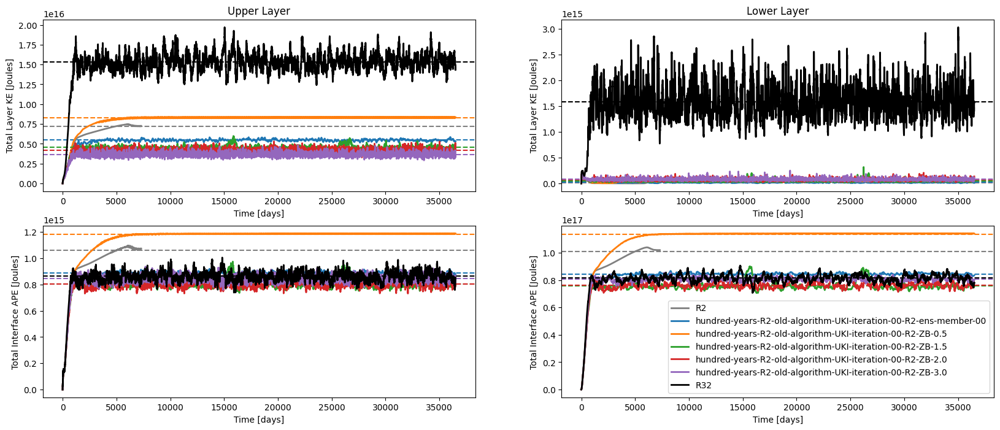

In [11]:
ds.plot_series(['R2', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-0.5',  'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-1.5', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-2.0', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-3.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-5.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-10.0', 
                'R32'])

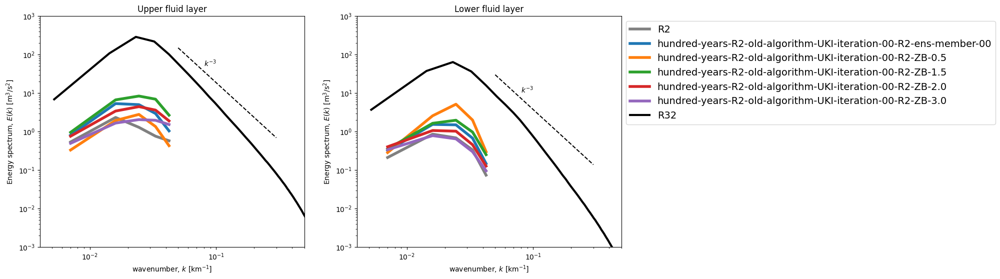

In [12]:
ds.plot_KE_spectrum(['R2', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-0.5',  'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-1.5', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-2.0', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-3.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-5.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-10.0', 
                'R32'])

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2


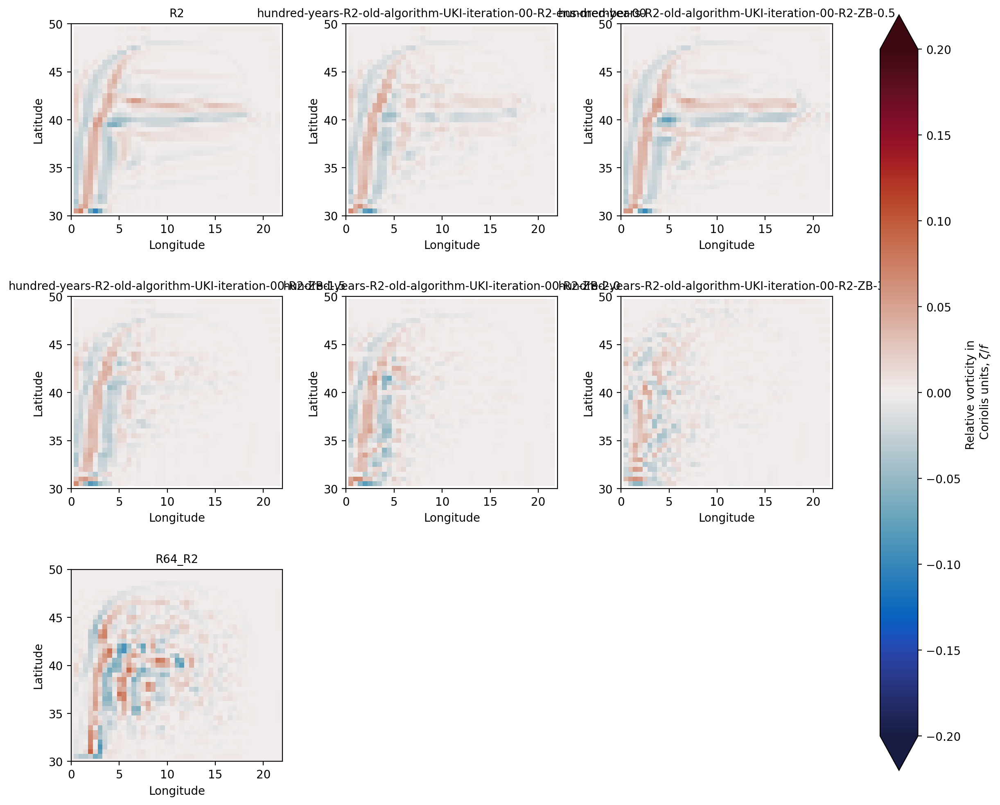

In [16]:
ds.remesh('R64', 'R2')
ds.plot_RV(['R2', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-0.5',  
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-1.5', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-2.0', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-3.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-5.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-10.0', 
                'R64_R2'])

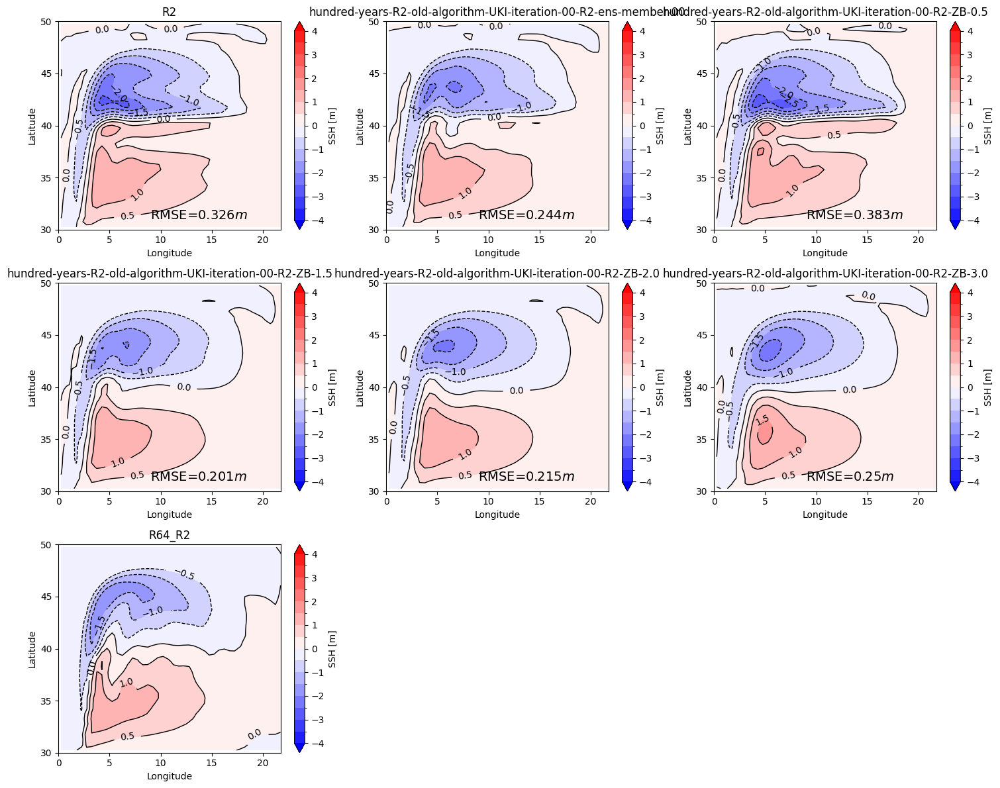

In [18]:
ds.plot_ssh(['R2', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-0.5',  
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-1.5', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-2.0', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-3.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-5.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-10.0', 
                'R64_R2'])

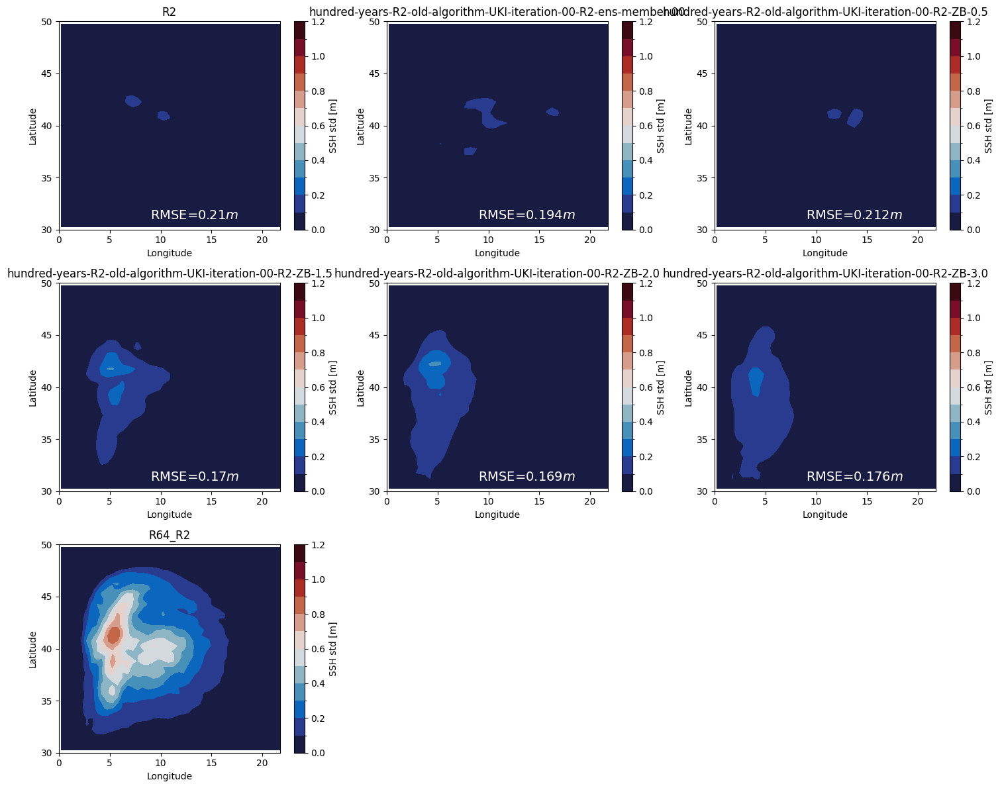

In [20]:
ds.plot_ssh_std(['R2', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ens-member-00', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-0.5',  
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-1.5', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-2.0', 
                'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-3.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-5.0', 
                #'hundred-years-R2-old-algorithm-UKI-iteration-00-R2-ZB-10.0', 
                'R64_R2'], target='R64_R2')

# Why old ensemble was not sensitive to weights?

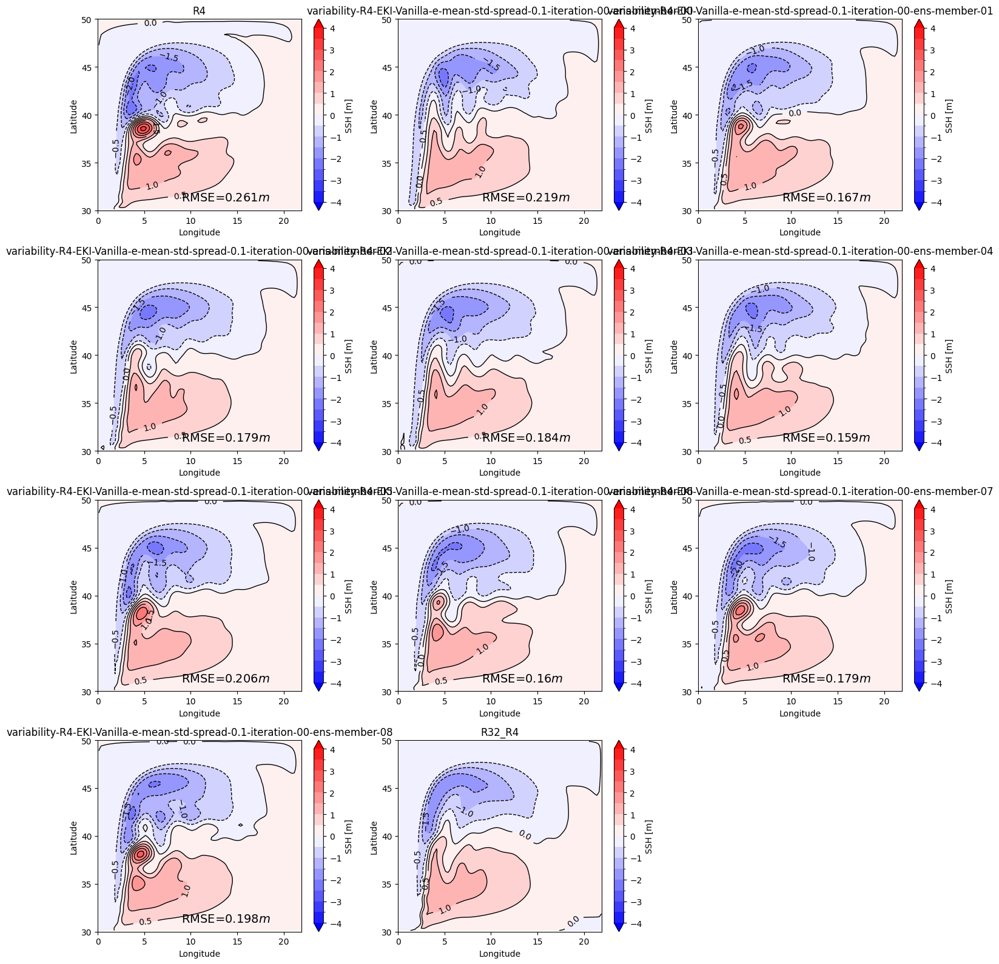

In [46]:
ds.plot_ssh(['R4', 'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-00', 'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-01',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-02',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-03',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-04',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-05',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-06',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-07',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-08',
             'R32_R4'])

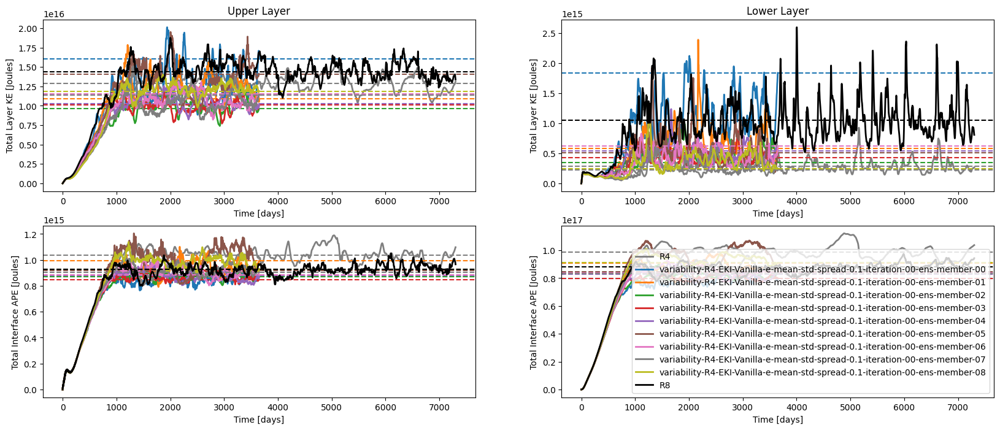

In [48]:
ds.plot_series(['R4', 'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-00', 'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-01',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-02',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-03',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-04',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-05',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-06',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-07',
             'variability-R4-EKI-Vanilla-e-mean-std-spread-0.1-iteration-00-ens-member-08',
             'R8'])

# Defining filter width

In [63]:
ds.remesh('R64', 'R2')

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2


In [58]:
for RR in ['R2', 'R4', 'R8']:
    ds.remesh('R64', RR, operator=gaussian_remesh, FGR=np.sqrt(12), exp=f'R64_{RR}_FGR-sqrt12')

for RR in ['R2', 'R4', 'R8']:
    for file in [f'/scratch/pp2681/Yellowstone/filtered-data/R64_{RR}_FGR-sqrt12-part1.nc', 
                 f'/scratch/pp2681/Yellowstone/filtered-data/R64_{RR}_FGR-sqrt12-part2.nc',
                 f'/scratch/pp2681/Yellowstone/filtered-data/R64_{RR}_FGR-sqrt12-part3.nc']:
            dataset = xr.open_dataset(file, decode_times=False)
            for key in dataset.keys():
                var = dataset[key]
                #var['Time'] = ds['R64'].u['Time']
                setattr(ds[f'R64_{RR}_FGR-sqrt12'], key, var)

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2_FGR-sqrt12
Experiment R64 coarsegrained to R4 is created. Its identificator=R64_R4_FGR-sqrt12
Experiment R64 coarsegrained to R8 is created. Its identificator=R64_R8_FGR-sqrt12


In [59]:
for RR in ['R2', 'R4', 'R8']:
    ds.remesh('R64', RR, operator=gaussian_remesh, FGR=np.sqrt(12), exp=f'R64_{RR}_FGR-sqrt6')

for RR in ['R2', 'R4', 'R8']:
    for file in [f'/scratch/pp2681/Yellowstone/filtered-data/R64_{RR}_FGR-sqrt6-part1.nc', 
                 f'/scratch/pp2681/Yellowstone/filtered-data/R64_{RR}_FGR-sqrt6-part2.nc',
                 f'/scratch/pp2681/Yellowstone/filtered-data/R64_{RR}_FGR-sqrt6-part3.nc']:
            dataset = xr.open_dataset(file, decode_times=False)
            for key in dataset.keys():
                var = dataset[key]
                #var['Time'] = ds['R64'].u['Time']
                setattr(ds[f'R64_{RR}_FGR-sqrt6'], key, var)

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2_FGR-sqrt6
Experiment R64 coarsegrained to R4 is created. Its identificator=R64_R4_FGR-sqrt6
Experiment R64 coarsegrained to R8 is created. Its identificator=R64_R8_FGR-sqrt6


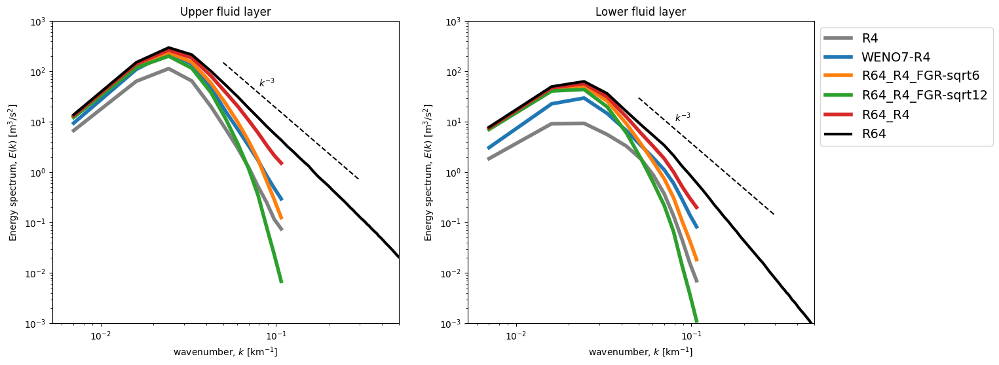

In [60]:
ds.plot_KE_spectrum(['R4', 'WENO7-R4', 'R64_R4_FGR-sqrt6', 'R64_R4_FGR-sqrt12', 'R64_R4', 'R64']);

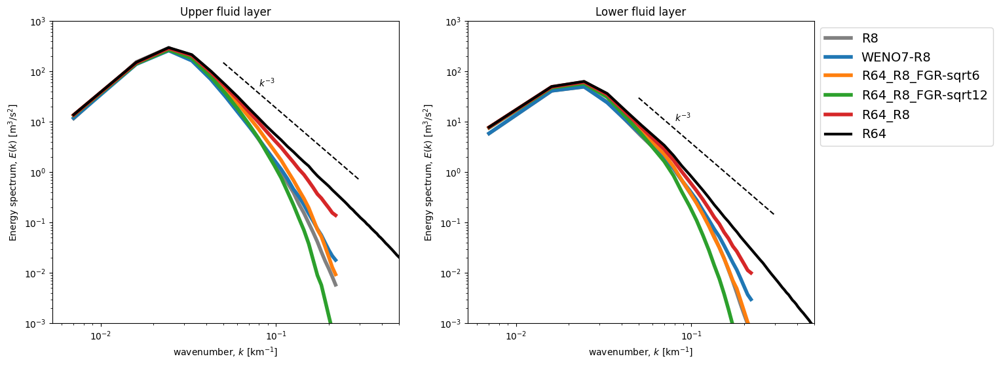

In [61]:
ds.plot_KE_spectrum(['R8', 'WENO7-R8', 'R64_R8_FGR-sqrt6', 'R64_R8_FGR-sqrt12', 'R64_R8', 'R64']);

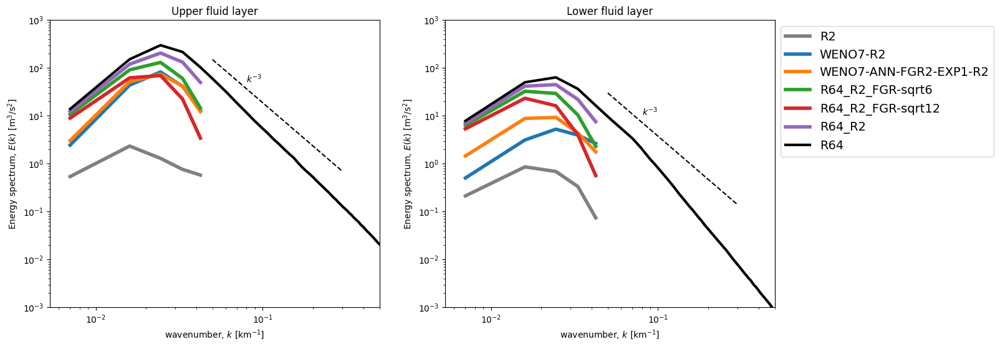

In [66]:
ds.plot_KE_spectrum(['R2', 'WENO7-R2', 'WENO7-ANN-FGR2-EXP1-R2', 'R64_R2_FGR-sqrt6', 'R64_R2_FGR-sqrt12', 'R64_R2', 'R64']);

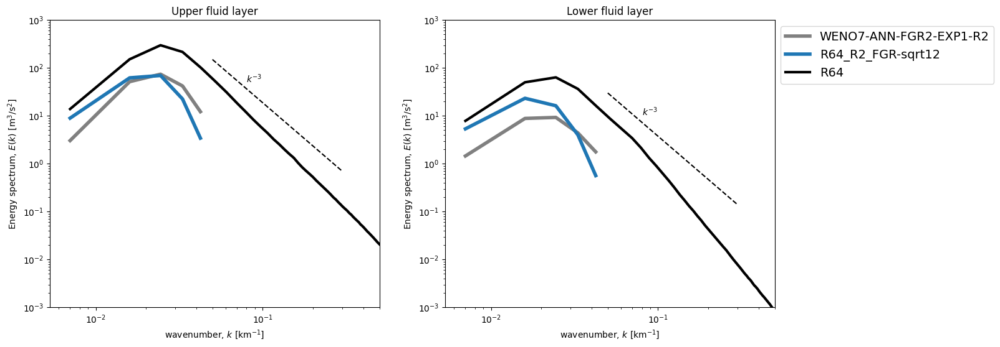

In [69]:
ds.plot_KE_spectrum(['WENO7-ANN-FGR2-EXP1-R2', 'R64_R2_FGR-sqrt12', 'R64']);

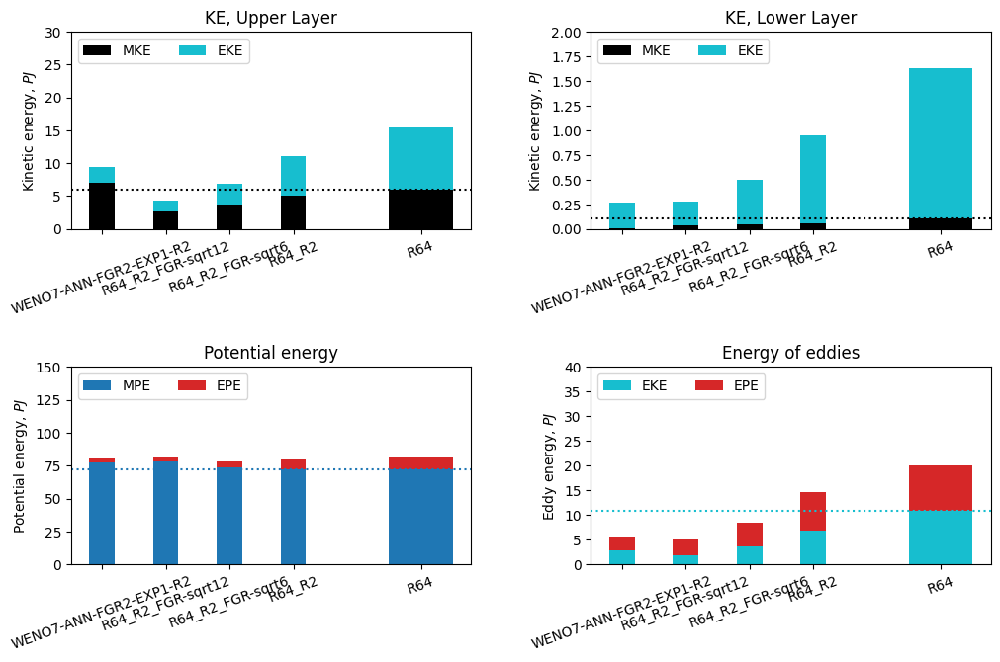

In [71]:
ds.plot_KE_PE(['WENO7-ANN-FGR2-EXP1-R2', 'R64_R2_FGR-sqrt12', 'R64_R2_FGR-sqrt6', 'R64_R2', 'R64']);

In [ ]:
ds.plot_KE_PE_simpler(['WENO7-ANN-FGR2-EXP1-R2', 'R64_R2_FGR-sqrt12', 'R64_R2_FGR-sqrt6', 'R64_R2', 'R64']);